# Mini Project: Resilience in young adults with relation to received and perceived Social support

Name: **Krish Agarwal** <br>
Reg No: **21112016** <br>
Class: **3BSc DS A** <br>

---------------

# **About the Psycological Evaluation**  
The class of 3BSc DS of CHRIST (Deemed to be University) Pune, Lavasa Campus had to submit a Mini Project as a final submission component for their subject - Data Analytics with Mini Project.  
I conducted a psychological evaluation with students as the target population for the same. The evaluation aimed at calculating the Resilience and Social Support Score for individuals.  
<br>
**Social Support**: A network of family, friends, neighbors, and community members that is available in times of need to give psychological, physical, and financial help.  
**Resilience**: The ability to cope with and recover from setbacks.
<br>  
After the scores were calculated, various types of Regressions were done on the data to predict the Resilience Score from Social Support variables. The project primarily focuses on pre-processing and data wrangling rather than Machine Learning itself. The Questionnaire selected for this evaluation has already been used in publications and have a valid and verified scoring technique.
<br>  
The links to the questionnaire and their respective scoring techniques are listed below:  
1. Social Support: https://elcentro.sonhs.miami.edu/research/measures-library/mspss/index.html#:~:text=The%20Multidimensional%20Scale%20of%20Perceived,%2C%205%20%3D%20strongly%20agree  
1. Resilience: https://www.nwpgmd.nhs.uk/sites/default/files/resiliencequestionnaire.pdf


## **Objective**:  
1. Data Wrangling using various regex and pandas functions.
2. Caculating Resilience and Social Support Score of individuals.  
3. Performing various types of Regression Analysis to predict the R Score using Social Support variables.
4. Feature Selection using correlation between variables.  
5. Create a local server to host the prediction

## **Problem Definition**:

Collect data from students and calculate their Resilience and Social Support Score. The data collected is considered to be noisy and hence, imply various functions offered by libraries to clean the same and gain meaningful insightfuls.

## **Approach/Method**:

1. Collecting survey throughout the campus to gather data.
2. Importing and structuring the data onto pandas dataframe.
3. Renaming the columns for easy computation.
4. Creating user-defined functions for data conversion to accepted scale.
5. Extensive Data for useful insights.
6. Pre processing the data for Regression Analysis.
7. Various types of Regression Analysis and boosting methods.
8. Deployment of method using Flask, HTML and CSS.

## **Observation**:

1. Majority of the population belong to Maharashtra which is followed up people from Gujarat.
2. The male to female ratio is tending more to the male side with more than 50 males.
3. Majority of the students fall under the 'Moderate' category under Social Support (54.3%) followed by ‘High’ (41%) and then ‘Low’ (4.8%).
4. Majority of the students belong in the 'Developing' (37.1%) under the Resilience Status followed by 'Established' (31.4%), 'Strong' (2050 and then 'Exceptional' (11.4%).
5. Under the correlation heatmap, we observed that 12 variables, excluding 'SS Score' itself, have more than moderate and up to high correlation with 'SS Score'. In case of 'R Score', we only get 10 variables so, we get our target variable to be 'SS Score'.
6. There is a slight linear relation between 'SS Score' and 'R Score'.
7. Under SS Status, 'Low' Status is majorly comprised of Males, folloewd by 'Moderate' which is majorly comprised of Females and then, 'High' which is majorly comprised of Males.
8. Under R Status, 'Developing' Status is majorly comprised of Females, followed by 'Established' which is majorly comprised of Males, then 'Strong' which is majorly comprised of Males and finally 'Exceptional' which majorly comprises Males.
9. Students from ‘Chhattisgarh’ have high Social Support score.
10. Students from 'Chhattisgarh' and 'Assam' have high Resilience Support Score.
11. The highest R Score belongs to a Male from Gujarat whereas the lowest R Score belongs to a Female from Telangana.
12. The highest SS Score belongs to a Male from Gujarat whereas the lowest SS Score also belongs to a Male from Gujarat.

## **Results**:

1. The highest R Score belongs to a Male from Gujarat whereas the lowest R Score belongs to a Female from Telangana.
2. The highest SS Score belongs to a Male from Gujarat whereas the lowest SS Score also belongs to a Male from Gujarat.
3. The Ridge Regression holds the highest accuracy amongst various other models to predict the ‘R Score’ using Social Support variables.  


## **Learning and Reflections**:

1. Exposure to various new libraries like regular expressions, plotly, sklearn and other languages like HTML & CSS.
2. Error handling. Coming across various errors and how to overcome them. Helping fellow students debug their code exposed me to various platforms and various implications of logical reasoning.

## **References**:

1. Stackoverflow
2. Geeks for Geeks
3. Youtube
4. Javapoint
5. W3school
6. Associates: Harshita Vemulapalli and Naive George Eapen

## **Code**:

In [1]:
# importing all the necessary liraries/modules

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from yellowbrick.regressor import ResidualsPlot
import plotly.express as px
import math  
import re
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.metrics import classification_report
from sklearn.linear_model import Ridge
from sklearn.tree import DecisionTreeRegressor
from sklearn.tree import plot_tree
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import SGDRegressor
from sklearn.model_selection import cross_val_score
from sklearn.preprocessing import scale
from sklearn.compose import TransformedTargetRegressor
from sklearn.preprocessing import QuantileTransformer
from sklearn.ensemble import GradientBoostingRegressor
import lightgbm
import xgboost
import pickle

# **Importing the dataset**

In [2]:
# Storing the original data into a seperate variable
df_original = pd.read_csv('C:/Users/Lenovo/Desktop/KRISH/Data Analytics/MiniProject.csv')

In [3]:
# Creating a copy dataframe for further process
df = df_original.copy()

# **Renaming every columnns**

In [4]:
# Storing the list of all initial column names in a list
initial_columns = list(df.columns)

In [5]:
# Storing the name of new column names in a list
new_columns = ['Timestamp', 'Email', 'Consent', 'Name', 'Age', 'Gender', 'State', 'SS1', 'SS2', 'SS3', 'SS4', 'SS5', 'SS6', 'SS7', 'SS8', 'SS9', 'SS10', 'SS11', 'SS12', 
             'R1', 'R2', 'R3', 'R4', 'R5', 'R6', 'R7', 'R8', 'R9', 'R10', 'R11', 'R12']

'''
SS --> Social Support
R --> Resilience
'''

'\nSS --> Social Support\nR --> Resilience\n'

In [6]:
# User-Defined function for renaming function
def renameColumn(df, old_column, new_column):
  df.rename(columns = {old_column : new_column}, inplace = True)

In [7]:
# Renaming all the columns
for i in range(len(initial_columns)):
  renameColumn(df, initial_columns[i], new_columns[i])

# **Making the data anonymous**

In [8]:
df = df[['Age', 'Gender', 'State', 'SS1', 'SS2', 'SS3', 'SS4', 'SS5', 'SS6', 'SS7', 'SS8', 'SS9', 'SS10',
       'SS11', 'SS12', 'R1', 'R2', 'R3', 'R4', 'R5', 'R6', 'R7', 'R8', 'R9', 'R10', 'R11', 'R12']]

# **Basical Statistical summary about the dataframe**

In [9]:
# Printing the basic idea about the df
print("Total number of NA values in df:", df.isna().sum().sum(), "\nTotal number of columns in df:", len(df.columns), "\nTotal number of data points:", len(df))

Total number of NA values in df: 171 
Total number of columns in df: 27 
Total number of data points: 108


In [10]:
df.describe()

,Age,Gender,State,SS1,SS2,SS3,SS4,SS5,SS6,SS7,...,R3,R4,R5,R6,R7,R8,R9,R10,R11,R12
count,108,108,108,105,99,105,103,102,101,103,...,100,99,102,101,101,102,99,100,99,101
unique,17,3,20,7,38,27,27,33,25,28,...,19,22,22,21,20,23,20,23,22,22
top,19,Male,Maharashtra,Agree,7,7,5,7,6,6,...,3,4,5,4,3,1,3,4,4,3
freq,37,58,24,33,16,18,21,17,19,19,...,21,34,19,28,22,19,29,26,25,27


In [11]:
# data types of all the columns
df.dtypes

Age       object
Gender    object
State     object
SS1       object
SS2       object
SS3       object
SS4       object
SS5       object
SS6       object
SS7       object
SS8       object
SS9       object
SS10      object
SS11      object
SS12      object
R1        object
R2        object
R3        object
R4        object
R5        object
R6        object
R7        object
R8        object
R9        object
R10       object
R11       object
R12       object
dtype: object

# **Cleaning every column**

## **1. Age**

In [12]:
# segregating the numerical and categorical values
age_outliers = []
age_integers = []

for i in range(len(df['Age'].unique())):
  if len(df['Age'].unique()[i]) == 2 or len(df['Age'].unique()[i]) == 3:
    age_integers.append(df['Age'].unique()[i])
  else:
    age_outliers.append(df['Age'].unique()[i])

In [13]:
# converting the data type of numerical data from string to integer
age_integers = [eval(i) for i in age_integers]

In [14]:
# Calculating the mean of the ages of people under the age of 30
mean_age = []

for i in range(len(age_integers)):
  if age_integers[i] < 30:
    mean_age.append(age_integers[i])

In [15]:
# Dealing with the outliers manually
for i in range(len(df['Age'])):
  if df['Age'][i] == "Twenty":
    df['Age'][i] = 20
  if df['Age'][i] == 'Nan ' or df['Age'][i] == 'Why you need my age(1000)':
    df['Age'][i] = round(sum(mean_age)/len(mean_age))

In [16]:
# Changing the data type of columnn to int
df['Age'] = df['Age'].astype(int)

## **Social Support Scale:**

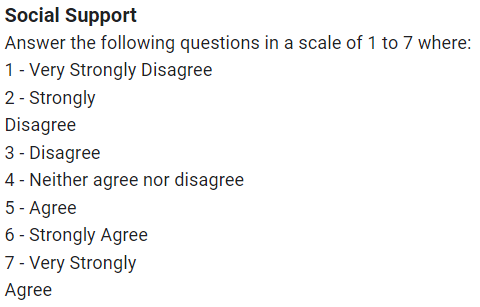

## **2. There is a special person who is around when I am in need (SS1)**

In [17]:
df['SS1'].unique()

array(['Agree', 'Neither agree nor disagree', 'Strongly Agree',
       'Very Strongly Agree', 'Very Strongly Disagree', 'Disagree', nan,
       'Strongly Disagree'], dtype=object)

In [18]:
# COnverting the data to numeric according to the scale
df['SS1'] = df['SS1'].map({'Very Strongly Disagree': 1, 'Strongly Disagree': 2, 'Disagree': 3, 'Neither agree nor disagree': 4, 'Agree': 5, 'Strongly Agree': 6, 'Very Strongly Agree': 7})

In [19]:
# creating a list of all unnique values except NaN
ss1_unique = list(df.SS1.unique())
ss1_unique.pop(6)

nan

In [20]:
# Calculating the mean of the column
ss1_mean = 0
for i in range(len(ss1_unique)):
  ss1_mean += ss1_unique[i]

In [21]:
# Filling the NaN values with the mean of other values
df['SS1'] = df['SS1'].replace(np.nan, round(ss1_mean/len(ss1_unique)))

In [22]:
df.SS1 = (df.SS1).astype(int)

## **3. There is a special person with whom I can share my joys and sorrows (SS2)**

In [23]:
# Checking for unique values before analyzing the column
df['SS2'].unique()

array(['3', 'yes', '5', 'Yeah, kind of ig ', nan, '7', 'yessssssssss',
       'YES', '1', 'Neither agree nor disagree', 'Agree',
       'Yes but rarely.', 'Very strongly Agree', 'Yes, sometimes', 'Five',
       'Yes', 'Maybe', 'My daughter', 'Nan ', '6', 'Strongly disagree ',
       "I had one but after a fight I'm all alone. Noone one to one me anymore.",
       '242', 'agree', 'Agree ', 'Definitely yes', '2', '4',
       'Strongly Disagree', 'Strongly Agree', 'Friends ', 'No', '6 ',
       'Very Strongly Agree', 'Disagree ', 'Sure', 'Mother ',
       'Strongly agree', '.'], dtype=object)

In [24]:
# Creatinng user-defined functions to convert the texts to their respective category
def convertTo1(df, column_name):
  df[column_name] = df[column_name].replace(to_replace = "(.*)([vV][eE][rR][yY][ |\w][sS][tT][rR][oO][nN][gG][lL][yY][ |\w][dD])(.*)", value = '1', regex = True)

In [25]:
def convertTo2(df, column_name):
  df[column_name] = df[column_name].replace(to_replace = "(.*)([sS][tT][rR][oO][nN][gG][lL][yY][ |\w][dD])(.*)", value = '2', regex = True)

In [26]:
def convertNo(df, column_name):
  df[column_name] = df[column_name].replace(to_replace = "(.*)([nN]([oO]|[nN][eE]|[pP]))(.*)", value = '2', regex = True)

In [27]:
def convertTo3(df, column_name):
  df[column_name] = df[column_name].replace(to_replace = "(.*)([dD][iI][sS][aA][gG][rR][eE])(.*)", value = '3', regex = True)

In [28]:
def convertTo4(df, column_name):
  df[column_name] = df[column_name].replace(to_replace = "(.*)[nN][eE][iI][tT][hH][eEe][rR](.*)", value = '4', regex = True)

In [29]:
def convertTo5(df, column_name):
  df[column_name] = df[column_name].replace(to_replace = "(.*)([aA][gG][rR][eE])(.*)", value = '5', regex = True)

In [30]:
def convertTo6(df, column_name):
  df[column_name] = df[column_name].replace(to_replace = "(.*)([sS][tT][rR][oO][nN][gG][lL][yY][ |\w][aA])(.*)", value = '6', regex = True)

In [31]:
def convertYes(df, column_name):
  df[column_name] = df[column_name].replace(to_replace = "(.*)([yY][eE]([sS]|[pP]|[aA]))(.*)", value = '6', regex = True)

In [32]:
def convertTo7(df, column_name):
  df[column_name] = df[column_name].replace(to_replace = "(.*)([vV][eE][rR][yY][ |\w][sS][tT][rR][oO][nN][gG][lL][yY][ |\w][aA])(.*)", value = '7', regex = True)

In [33]:
def convertDot(df, column_name):
  df[column_name] = df[column_name].replace(to_replace = "(.*)\.(.*)", value = '4', regex = True)

In [34]:
# Converting text to their respective categories

convertTo4(df, 'SS2')
convertTo7(df, 'SS2')
convertTo6(df, 'SS2')
convertTo3(df, 'SS2')
convertTo5(df, 'SS2')
convertYes(df, 'SS2')
convertNo(df, 'SS2')

In [35]:
# Converting remaining entries manually

df['SS2'] = df['SS2'].replace(to_replace = "", value = '7', regex = True)
df['SS2'] = df['SS2'].replace(to_replace = "(.*)Five(.*)", value =  "5", regex = True)
df['SS2'] = df['SS2'].replace(to_replace = "(.*)Maybe(.*)", value =  "4", regex = True)
df['SS2'] = df['SS2'].replace(to_replace = "(.*)My daughter(.*)", value =  "7", regex = True)
df['SS2'] = df['SS2'].replace(to_replace = "(.*)Mother(.*)", value =  "7", regex = True)
df['SS2'] = df['SS2'].replace(to_replace = "(.*)Friends(.*)", value =  "7", regex = True)
df['SS2'] = df['SS2'].replace(to_replace = "(.*)Sure(.*)", value =  "6", regex = True)
df['SS2'] = df['SS2'].replace(to_replace = "(.*)242(.*)", value =  "4", regex = True)
df['SS2'] = df['SS2'].replace(to_replace = "(.*)6 (.*)", value =  "4", regex = True)
df['SS2'] = df['SS2'].replace(to_replace = "Nan ", value = "4")
convertDot(df, 'SS2')
df['SS2'] = df['SS2'].replace(to_replace = np.nan, value = "4")

In [36]:
# Checking for unique values post analyzing the column
df['SS2'].unique()

array(['3', '6', '5', '4', '7', '1', '2'], dtype=object)

In [37]:
# Changing the data type of columnn to int
df['SS2'] = df['SS2'].astype(int)

## **4. My family really tries to help me (SS3)**

In [38]:
# Checking for unique values before analyzing the column
df['SS3'].unique()

array(['6', 'yes, if I share every info to them.', '7',
       'Yep, 1000% they do.', 'Yes', 'yes', '5', nan, 'NOT REALLY',
       'Strongly Agree', 'No', 'Neither agree nor disagree', '3',
       'Yes, always', 'Six', 'Yes of course ', 'Strongly agree ',
       'Very strongly disagree ', "Let's not  talk about  them.",
       'strongly agree', '4', 'Agree', '1', '2', 'Not exactly ',
       'Yes they do', 'Very Strongly Agree', '.'], dtype=object)

In [39]:
# Converting text to their respective categories

convertYes(df, 'SS3')
convertTo7(df, 'SS3')
convertTo1(df, 'SS3')
convertNo(df, 'SS3')
convertTo6(df, 'SS3')
convertTo4(df, 'SS3')
convertTo5(df, 'SS3')

In [40]:
# Converting remaining entries manually

df['SS3'] = df['SS3'].replace(to_replace = "Six", value = '6', regex = True)
convertDot(df, 'SS3')
df['SS3'] = df['SS3'].replace(to_replace = np.nan, value = "4")

In [41]:
# Checking for unique values post analyzing the column
df['SS3'].unique()

array(['6', '7', '5', '4', '2', '3', '1'], dtype=object)

In [42]:
# Changing the data type of columnn to int
df['SS3'] = df['SS3'].astype(int)

## **5. I get the emotional help and support I need from my family (SS4)**

In [43]:
# Checking for unique values before analyzing the column
df['SS4'].unique()

array(['5', 'yes', '6', 'Yep.', nan, '7', 'SOMETIMES', 'Agree',
       'Neutral agree not disagree', 'Yes absolutely',
       'Neither Agree nor Disagree', '3', 'Seven', 'Yes',
       'Yes I definitely do', '4', 'Very strongly disagree ', 'disagree',
       'Maybe ', '1', 'No', '2', 'Not exactly ', 'Strongly Agree',
       'Sometimes', 'Strongly agree ', 'Dont need', '.'], dtype=object)

In [44]:
# Converting text to their respective categories

convertTo1(df, 'SS4')
convertTo4(df, 'SS4')
convertTo6(df, 'SS4')
convertTo3(df, 'SS4')
convertTo5(df, 'SS4')
convertYes(df, 'SS4')
convertNo(df, 'SS4')

In [45]:
# Converting remaining entries manually

df['SS4'] = df['SS4'].replace(to_replace = "Seven", value = '7', regex = True)
df['SS4'] = df['SS4'].replace(to_replace = "Dont need", value = '3', regex = True)
df['SS4'] = df['SS4'].replace(to_replace = "(Sometimes)|(SOMETIMES)|(Maybe )", value = '5', regex = True)
convertDot(df, 'SS4')
df['SS4'] = df['SS4'].replace(to_replace = np.nan, value = '4', regex = True)

In [46]:
# Checking for unique values post analyzing the column
df['SS4'].unique()

array(['5', '6', '4', '7', '3', '1', '2'], dtype=object)

In [47]:
# Changing the data type of columnn to int
df['SS4'] = df['SS4'].astype(int)

## **6. I have a special person who is a real source of comfort to me (SS5)**

In [48]:
# Checking for unique values before analyzing the column
df['SS5'].unique()

array(['4', 'yes', 'Yep. ', nan, '6', '7', '5', 'NAH', '1',
       'Neither agree nor disagree', 'Agree', 'Not really',
       'Very Strongly Agree', 'Yes, her name is Kelly', 'Six', 'Yes',
       'Maybe', 'My sir', 'Nan ', 'My Mom', 'Very strongly disagree ',
       'Just you.', 'strongly agree', 'Yes ', 'Agree ', 'No', '3', '2',
       'Strongly Disagree', 'Strongly Agree', 'Strongly agree',
       'Disagree ', 'Sure', '.'], dtype=object)

In [49]:
# Converting text to their respective categories

convertTo7(df, 'SS5')
convertTo1(df, 'SS5')
convertTo4(df, 'SS5')
convertTo6(df, 'SS5')
convertTo2(df, 'SS5')
convertTo3(df, 'SS5')
convertTo5(df, 'SS5')
convertYes(df, 'SS5')
convertNo(df, 'SS5')

In [50]:
# Converting remaining entries manually

df['SS5'] = df['SS5'].replace(to_replace = "(Six)", value = '6', regex = True)
df['SS5'] = df['SS5'].replace(to_replace = "(Maybe)|(Sure)", value = '5', regex = True)
df['SS5'] = df['SS5'].replace(to_replace = "Just you.", value = '1', regex = True)
df['SS5'] = df['SS5'].replace(to_replace = "(My Mom)|(My sir)", value = '7', regex = True)
df['SS5'] = df['SS5'].replace(to_replace = "Nan ", value = '4', regex = True)
df['SS5'] = df['SS5'].replace(to_replace = "NAH", value = '2', regex = True)
convertDot(df, 'SS5')
df['SS5'] = df['SS5'].replace(to_replace = np.nan, value = '4')

In [51]:
# Checking for unique values post analyzing the column
df['SS5'].unique()

array(['4', '6', '7', '5', '2', '1', '3'], dtype=object)

In [52]:
# Changing the data type of columnn to int
df['SS5'] = df['SS5'].astype(int)

## **7. My friends really try to help me (SS6)**

In [53]:
# Checking for unique values before analyzing the column
df['SS6'].unique()

array(['6', 'yes', '5',
       'Yeah, they do, nut all have their good times and bad times, so I leave them to that.',
       nan, 'TRUE', 'Neither agree nor disagree', 'Strongly Agree', '7',
       'Most of the times', 'Neither Agree Nor Disagree', 'Six', 'Yes',
       'No', 'Agree', 'Nan ', '4', 'Disagree ', 'very strongly agree',
       'Neither agree nor disagree ', '1', "I don't know ",
       'Strongly Disagree', '3', 'Strongly agree ', '.'], dtype=object)

In [54]:
# Converting text to their respective categories

convertTo4(df, 'SS6')
convertTo6(df, 'SS6')
convertTo2(df, 'SS6')
convertTo3(df, 'SS6')
convertTo5(df, 'SS6')
convertYes(df, 'SS6')
convertNo(df, 'SS6')

In [55]:
# Converting remaining entries manually

df['SS6'] = df['SS6'].replace(to_replace = "(Six)|(TRUE)|(Most of the times)", value = '6', regex = True)
df['SS6'] = df['SS6'].replace(to_replace = "Nan ", value = '4', regex = True)
convertDot(df, 'SS6')
df['SS6'] = df['SS6'].replace(to_replace = np.nan, value = '4')

In [56]:
# Checking for unique values post analyzing the column
df['SS6'].unique()

array(['6', '5', '4', '7', '2', '3', '1'], dtype=object)

In [57]:
# Changing the data type of columnn to int
df['SS6'] = df['SS6'].astype(int)

## **8. I can count on my friends when things go wrong (SS7)**

In [58]:
# Checking for unique values before analyzing the column
df['SS7'].unique()

array(['5', 'yes', 'Yep.', nan, '6', '1', '-',
       'Neutral agree not disagree', '7', 'Sometimes', 'Disagree', 'No',
       'Six', 'Yes', 'Agree', '3', 'Just you ', 'very strongly agree',
       'Neither agree nor disagree ', 'Nan', '4', 'Strongly disagree',
       'Nope ', 'Strongly Agree', 'Neither agree nor disagree',
       'Disagree ', 'Yes ', 'Agree ', '.'], dtype=object)

In [59]:
# Converting text to their respective categories

convertTo4(df, 'SS7')
convertTo1(df, 'SS7')
convertTo7(df, 'SS7')
convertTo2(df, 'SS7')
convertTo6(df, 'SS7')
convertTo3(df, 'SS7')
convertTo5(df, 'SS7')
convertYes(df, 'SS7')
convertNo(df, 'SS7')

In [60]:
# Converting remaining entries manually

df['SS7'] = df['SS7'].replace(to_replace = "Just you ", value = '1', regex = True)
df['SS7'] = df['SS7'].replace(to_replace = "(Nan)|(-)", value = '4', regex = True)
df['SS7'] = df['SS7'].replace(to_replace = "(Six)", value = '6', regex = True)
df['SS7'] = df['SS7'].replace(to_replace = "Sometimes", value = '5', regex = True)
convertDot(df, 'SS7')
df['SS7'] = df['SS7'].replace(to_replace = np.nan, value = '4')

In [61]:
# Checking for unique values post analyzing the column
df['SS7'].unique()

array(['5', '6', '4', '1', '3', '7', '2'], dtype=object)

In [62]:
# Changing the data type of columnn to int
df['SS7'] = df['SS7'].astype(int)

## **9. I can talk about my problems with my family (SS8)**

In [63]:
# Checking for unique values before analyzing the column
df['SS8'].unique()

array(['4', 'yes', '6', 'Not all, but yeah.', nan, '5', '7',
       'DONT WANT TO', 'Neither agree nor disagree', 'Agree', 'Sometimes',
       'Disagree', '2', 'Yes', 'Six', 'Not all problems',
       'Very strongly disagree ', '3', '1', 'disagree', '2.',
       'Neither agree nor disagree ', 'Not really', 'no', 'Not all',
       'Strongly Agree', 'No', '46', 'Disagree ', 'Sometimes ', 'Maybe',
       'Agree ', '.'], dtype=object)

In [64]:
# Converting text to their respective categories

convertTo4(df, 'SS8')
convertTo1(df, 'SS8')
convertTo6(df, 'SS8')
convertTo3(df, 'SS8')
convertTo6(df, 'SS8')
convertTo5(df, 'SS8')
convertNo(df, 'SS8')
convertYes(df, 'SS8')

In [65]:
# Converting remaining entries manually

df['SS8'] = df['SS8'].replace(to_replace = "DONT WANT TO", value = '2', regex = True)
df['SS8'] = df['SS8'].replace(to_replace = "(Nan)|(-)|(46)", value = '4', regex = True)
df['SS8'] = df['SS8'].replace(to_replace = "Six", value = '6', regex = True)
df['SS8'] = df['SS8'].replace(to_replace = "(.*)(Sometimes|Maybe)(.*)", value = '5', regex = True)
df['SS8'] = df['SS8'].replace(to_replace = "(.*)(2.)(.*)", value = '2', regex = True)
convertDot(df, 'SS8')
df['SS8'] = df['SS8'].replace(to_replace = np.nan, value = '4')

In [66]:
# Checking for unique values post analyzing the column
df['SS8'].unique()

array(['4', '6', '2', '5', '7', '3', '1'], dtype=object)

In [67]:
# Changing the data type of columnn to int
df['SS8'] = df['SS8'].astype(int)

## **10. I have friends with whom I can share my joys and sorrows (SS9)**

In [68]:
# Checking for unique values before analyzing the column
df['SS9'].unique()

array(['5', 'yes', '6', 'Yes.', nan, '7', 'YEA', '4', 'Agree',
       'Yes mate ', 'Very strongly disagree', 'Yes', 'Six', 'Nan',
       'Strongly disagree ', '1', 'very strongly agree',
       'Neither agree nor disagree ', 'Nope', '67', 'Strongly disagree',
       'Strongly Agree', 'Cousins ', '3',
       'Depends on what level of sorrow', 'Disagree ', '2', 'No', '.'],
      dtype=object)

In [69]:
# Converting text to their respective categories

convertTo4(df, 'SS9')
convertTo1(df, 'SS9')
convertTo7(df, 'SS9')
convertTo2(df, 'SS9')
convertTo6(df, 'SS9')
convertTo3(df, 'SS9')
convertTo5(df, 'SS9')
convertYes(df, 'SS9')
convertNo(df, 'SS9')

In [70]:
# Converting remaining entries manually

df['SS9'] = df['SS9'].replace(to_replace = "(Six)|(Cousins )", value = '6', regex = True)
df['SS9'] = df['SS9'].replace(to_replace = "(Nan)|(67)", value = '4', regex = True)
df['SS9'] = df['SS9'].replace(to_replace = "Depends on what level of sorrow", value = '4', regex = True)
convertDot(df, 'SS9')
df['SS9'] = df['SS9'].replace(to_replace = np.nan, value = '4')

In [71]:
# Checking for unique values post analyzing the column
df['SS9'].unique()

array(['5', '6', '4', '7', '1', '2', '3'], dtype=object)

In [72]:
# Changing the data type of columnn to int
df['SS9'] = df['SS9'].astype(int)

## **11. There is a special person in my life who cares about my feelings (SS10)**

In [73]:
# Checking for unique values before analyzing the column
df['SS10'].unique()

array(['5', 'yes', 'Not yet. ', nan, '6', '7', 'UMMM', '1', 'Disagree',
       'Agree', 'Nah', 'Very Strongly Agree', 'Yes', 'Six',
       'I don’t know', '4', 'Yes ', 'Nan ', 'Strongly disagree ', 'agree',
       '3', 'No', 'maybe', '2', 'Strongly disagree', 'Strongly Agree',
       'Brother ', 'Strongly agree', 'Disagree ', 'Sure', '.'],
      dtype=object)

In [74]:
# Converting text to their respective categories

convertTo7(df, 'SS10')
convertTo2(df, 'SS10')
convertTo6(df, 'SS10')
convertTo3(df, 'SS10')
convertTo5(df, 'SS10')
convertYes(df, 'SS10')
convertNo(df, 'SS10')

In [75]:
# Converting remaining entries manually

df['SS10'] = df['SS10'].replace(to_replace = "(UMMM)|(Nan )", value = '4', regex = True)
df['SS10'] = df['SS10'].replace(to_replace = "Nah", value = '2', regex = True)
df['SS10'] = df['SS10'].replace(to_replace = "(Six)|(maybe)|(Sure)|(Brother )", value = '6', regex = True)
convertDot(df, 'SS10')
df['SS10'] = df['SS10'].replace(to_replace = np.nan, value = '4')

In [76]:
# Checking for unique values post analyzing the column
df['SS10'].unique()

array(['5', '6', '2', '4', '7', '1', '3'], dtype=object)

In [77]:
# Changing the data type of columnn to int
df['SS10'] = df['SS10'].astype(int)

## **12. My family is willing to help me make decisions (SS11)**

In [78]:
# Checking for unique values before analyzing the column
df['SS11'].unique()

array(['6', 'yes', 'Yes, they do', nan, 'yesss', '5',
       'I MAKE MY OWN DECISIONS', 'agree', 'Strongly Agree ', '7',
       'Neither agree nor disagree', '2', ' Yes,', 'Seven', 'Yes',
       'Strongly agree ', 'Agree', '1', 'strongly agree', '4', '8', '3',
       'maybe', 'Not exactly ', 'Strongly Agree', 'Strongly agree',
       'Very Strongly Agree', 'No', 'Sure', '.'], dtype=object)

In [79]:
# Converting text to their respective categories

convertTo4(df, 'SS11')
convertTo7(df, 'SS11')
convertTo6(df, 'SS11')
convertTo5(df, 'SS11')
convertYes(df, 'SS11')
convertNo(df, 'SS11')

In [80]:
# Converting remaining entries manually

df['SS11'] = df['SS11'].replace(to_replace = "(I MAKE MY OWN DECISIONS)|(maybe)", value = '4', regex = True)
df['SS11'] = df['SS11'].replace(to_replace = "(Seven)|(8)", value = '7', regex = True)
df['SS11'] = df['SS11'].replace(to_replace = "Sure", value = '5', regex = True)
convertDot(df, 'SS11')
df['SS11'] = df['SS11'].replace(to_replace = np.nan, value = '4')

In [81]:
# Checking for unique values post analyzing the column
df['SS11'].unique()

array(['6', '4', '5', '7', '2', '1', '3'], dtype=object)

In [82]:
# Changing the data type of columnn to int
df['SS11'] = df['SS11'].astype(int)

## **13. I can talk about my problems with my friends (SS12)**

In [83]:
# Checking for unique values before analyzing the column
df['SS12'].unique()

array(['5', 'yes', '4', 'Yep.', nan, '6', 'MAYBE',
       'Neither agree nor disagree', 'Strongly Agree ', '7',
       'Predominantly', 'Disagree', 'To a certain extent, yes', 'Five',
       'Yes', 'Some friends', 'Very strongly agree', 'Strongly disagree ',
       '1', 'strongly agree', '3', 'Neither agree nor disagree ', 'Agree',
       'Strongly Agree', 'Nope', 'No', '54', 'Sure', '.', '2'],
      dtype=object)

In [84]:
# Converting text to their respective categories

convertTo4(df, 'SS12')
convertTo7(df, 'SS12')
convertTo2(df, 'SS12')
convertTo6(df, 'SS12')
convertTo3(df, 'SS12')
convertTo5(df, 'SS12')
convertYes(df, 'SS12')
convertNo(df, 'SS12')

In [85]:
# Converting remaining entries manually

df['SS12'] = df['SS12'].replace(to_replace = "(MAYBE)|(Predominantly)|(Five)|(Some friends)|(Sure)", value = '5', regex = True)
df['SS12'] = df['SS12'].replace(to_replace = "54", value = '4', regex = True)
convertDot(df, 'SS12')
df['SS12'] = df['SS12'].replace(to_replace = np.nan, value = '4')

In [86]:
# Checking for unique values post analyzing the column
df['SS12'].unique()

array(['5', '6', '4', '7', '3', '2', '1'], dtype=object)

In [87]:
# Changing the data type of columnn to int
df['SS12'] = df['SS12'].astype(int)

## **Social Support Scale:**

## **14. In a difficult spot, I turn at once to what can be done to put things right (R1)**

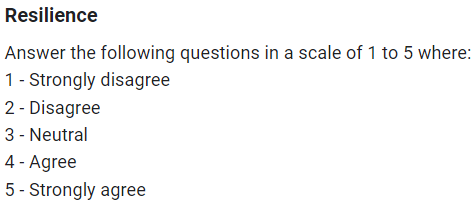

In [88]:
# Creatinng user-defined functions to convert the texts to their respective category
def to1(df, column_name):
  df[column_name] = df[column_name].replace(to_replace = "(.*)([sS][tT][rR][oO][nN][gG][lL][yY][ |\w][dD])(.*)", value = '1', regex = True)

In [89]:
def to2(df, column_name):
  df[column_name] = df[column_name].replace(to_replace = "(.*)([dD][iI][sS][aA][gG][rR][eE])(.*)", value = '2', regex = True)

In [90]:
def toNo(df, column_name):
  df[column_name] = df[column_name].replace(to_replace = "(.*)([nN]([oO]|[nN][eE]|[pP]))(.*)", value = '2', regex = True)

In [91]:
def to3(df, column_name):
  df[column_name] = df[column_name].replace(to_replace = "(.*)[nN][eE][uU][tT][rR][aA][lL](.*)", value = '3', regex = True)

In [92]:
def to4(df, column_name):
  df[column_name] = df[column_name].replace(to_replace = "(.*)([aA][gG][rR][eE])(.*)", value = '4', regex = True)

In [93]:
def toYes(df, column_name):
  df[column_name] = df[column_name].replace(to_replace = "(.*)([yY][eE]([sS]|[pP]|[aA]))(.*)", value = '4', regex = True)

In [94]:
def to5(df, column_name):
  df[column_name] = df[column_name].replace(to_replace = "(.*)([sS][tT][rR][oO][nN][gG][lL][yY][ |\w][aA])(.*)", value = '5', regex = True)

In [95]:
def toDot(df, column_name):
  df[column_name] = df[column_name].replace(to_replace = "(.*)\.(.*)", value = '3', regex = True)

In [96]:
# Checking for unique values before analyzing the column
df['R1'].unique()

array(['3', 'yes', '4', 'Most of the time, but not always.', nan, '5',
       'Neutral', 'Agree', 'Sometimes', 'Five', 'Yes', 'Three',
       'Neutral ', 'Nan ', '2', '7272', 'agree', '1', 'Disagree',
       'Stong agree', '.'], dtype=object)

In [97]:
# Converting text to their respective categories

to3(df, 'R1')
to5(df, 'R1')
to2(df, 'R1')
to4(df, 'R1')
toYes(df, 'R1')
toNo(df, 'R1')

In [98]:
# Converting remaining entries manually

df['R1'] = df['R1'].replace(to_replace = "(Sometimes)|(Three)|(Nan )|(7272)", value = '3', regex = True)
df['R1'] = df['R1'].replace(to_replace = "Five", value = '5', regex = True)
toDot(df, 'R1')
df['R1'] = df['R1'].replace(to_replace = np.nan, value = '3')

In [99]:
# Checking for unique values post analyzing the column
df['R1'].unique()

array(['3', '4', '2', '5', '1'], dtype=object)

In [100]:
# Changing the data type of columnn to int
df['R1'] = df['R1'].astype(int)

## **15. I influence where I can, rather than worrying about what I can’t influence (R2)**

In [101]:
# Checking for unique values before analyzing the column
df['R2'].unique()

array(['2', 'yes', '4', '5', nan, '3', 'Agree', 'No. I only give advice',
       'Six', 'Yes', 'four', 'Nan ', 'Strongly agree', 'Doubtful ',
       'agree', 'two', 'Neutral', 'Strong agree', '.', '1'], dtype=object)

In [102]:
# Converting text to their respective categories

to3(df, 'R2')
to5(df, 'R2')
to4(df, 'R2')
toYes(df, 'R2')
toNo(df, 'R2')

In [103]:
# Converting remaining entries manually

df['R2'] = df['R2'].replace(to_replace = "(Six)|(Doubtful )|(Nan )", value = '3', regex = True)
df['R2'] = df['R2'].replace(to_replace = "four", value = '4', regex = True)
df['R2'] = df['R2'].replace(to_replace = "two", value = '2', regex = True)
toDot(df, 'R2')
df['R2'] = df['R2'].replace(to_replace = np.nan, value = '3')

In [104]:
# Checking for unique values post analyzing the column
df['R2'].unique()

array(['2', '4', '5', '3', '1'], dtype=object)

In [105]:
# Changing the data type of columnn to int
df['R2'] = df['R2'].astype(int)

## 16. I don’t take criticism personally (R3)**

In [106]:
# Checking for unique values before analyzing the column
df['R3'].unique()

array(['1', '3', '5', nan, 'Neutral', 'Agree', '4', 'lol yeah ', 'Four ',
       'Yes', 'Disagree ', 'Disagree', '2', 'Strongly agree ', 'neutral',
       'maybe', 'Agree ', 'agree', '.', 'No'], dtype=object)

In [107]:
# Converting text to their respective categories

to3(df, 'R3')
to5(df, 'R3')
to2(df, 'R3')
to4(df, 'R3')
toYes(df, 'R3')
toNo(df, 'R3')

In [108]:
# Converting remaining entries manually

df['R3'] = df['R3'].replace(to_replace = 'Four ', value = '4', regex = True)
df['R3'] = df['R3'].replace(to_replace = 'maybe', value = '4', regex = True)
toDot(df, 'R3')
df['R3'] = df['R3'].replace(to_replace = np.nan, value = '3')

In [109]:
# Checking for unique values post analyzing the column
df['R3'].unique()

array(['1', '3', '5', '4', '2'], dtype=object)

In [110]:
# Changing the data type of columnn to int
df['R3'] = df['R3'].astype(int)

## **17. I generally manage to keep things in perspective (R4)**

In [111]:
# Checking for unique values before analyzing the column
df['R4'].unique()

array(['4', 'neutral', '5', 'Not always, but depends on stuff.', nan,
       'Neutral', 'Agree', 'absolutely', '  4', 'Five', 'Yes', 'Neutral ',
       '3', '1', 'Strongly agree ', '2', 'agree', 'Agrer', 'Of course ',
       'no', 'Takes time at the start', '.', 'No'], dtype=object)

In [112]:
# Converting text to their respective categories

to3(df, 'R4')
to5(df, 'R4')
to4(df, 'R4')
toYes(df, 'R4')
toNo(df, 'R4')

In [113]:
# Converting remaining entries manually

df['R4'] = df['R3'].replace(to_replace = '(absolutely)|(Five)|(Of course )', value = '5', regex = True)
df['R4'] = df['R3'].replace(to_replace = '(maybe)|(Takes time at the start)', value = '3', regex = True)
toDot(df, 'R4')
df['R4'] = df['R4'].replace(to_replace = np.nan, value = '3')

In [114]:
# Checking for unique values post analyzing the column
df['R4'].unique()

array([1, 3, 5, 4, 2])

In [115]:
# Changing the data type of columnn to int
df['R4'] = df['R4'].astype(int)

## **18. I am calm in a crisis (R5)**

In [116]:
# Checking for unique values before analyzing the column
df['R5'].unique()

array(['1', 'neutral', '4', 'Yes I am. I`m Captain Cool 1.', nan, '2',
       '3', '5', 'Neutral', 'Neutral ',
       'Nah man. I would freak the fuck out', 'Six', 'No', 'two', 'Agree',
       'Disagree', 'Strongly agree ', 'yes', 'Yes', '2 ',
       'Strongly disagree', '.', 'Always'], dtype=object)

In [117]:
# Converting text to their respective categories

to3(df, 'R5')
to1(df, 'R5')
to5(df, 'R5')
to2(df, 'R5')
to4(df, 'R5')
toYes(df, 'R5')
toNo(df, 'R5')

In [118]:
# Converting remaining entries manually

df['R5'] = df['R5'].replace(to_replace = '(.*)(Nah man)(.*)', value = '1', regex = True)
df['R5'] = df['R5'].replace(to_replace = '(Six)', value = '3', regex = True)
df['R5'] = df['R5'].replace(to_replace = '(two)|(2 )', value = '2', regex = True)
df['R5'] = df['R5'].replace(to_replace = 'Always', value = '2', regex = True)
toDot(df, 'R5')
df['R5'] = df['R5'].replace(to_replace = np.nan, value = '3')

In [119]:
# Checking for unique values post analyzing the column
df['R5'].unique()

array(['1', '3', '4', '2', '5'], dtype=object)

In [120]:
# Changing the data type of columnn to int
df['R5'] = df['R5'].astype(int)

## **19. I am good at finding solutions to problems (R6)**

In [121]:
# Checking for unique values before analyzing the column
df['R6'].unique()

array(['2', '4', '5', nan, '3', '1', 'Disagree', 'Agree',
       'For the most part', 'Five', 'No', 'three', 'Strongly agree',
       'Nan ', 'Neutral ', 'neutral', 'Finding problems ', 'yes',
       'Neutral', 'Yes', '7', '.'], dtype=object)

In [122]:
# Converting text to their respective categories

to3(df, 'R6')
to5(df, 'R6')
to2(df, 'R6')
to4(df, 'R6')
toYes(df, 'R6')
toNo(df, 'R6')

In [123]:
# Converting remaining entries manually

df['R6'] = df['R6'].replace(to_replace = 'Five', value = '5', regex = True)
df['R6'] = df['R6'].replace(to_replace = '(three)|(Nan )|(Finding problems )|(For the most part)|(7)', value = '3', regex = True)
toDot(df, 'R6')
df['R6'] = df['R6'].replace(to_replace = np.nan, value = '3')

In [124]:
# Checking for unique values post analyzing the column
df['R6'].unique()

array(['2', '4', '5', '3', '1'], dtype=object)

In [125]:
# Changing the data type of columnn to int
df['R6'] = df['R6'].astype(int)

## **20. I wouldn’t describe myself as an anxious person (R7)**

In [126]:
# Checking for unique values before analyzing the column
df['R7'].unique()

array(['1', '2', '4', nan, '3', '5', 'Neutral', 'Disagree ',
       'I would describe myself as an anxious person', 'Five', 'No',
       'two', 'Agree', 'Nan', 'Strongly disagree ', 'disagree', 'Agree ',
       'maybe', 'Strongly disagree', '.', 'Yes'], dtype=object)

In [127]:
# Converting text to their respective categories

to3(df, 'R7')
to1(df, 'R7')
to4(df, 'R7')
to4(df, 'R7')
toYes(df, 'R7')
toNo(df, 'R7')

In [128]:
# Converting remaining entries manually

df['R7'] = df['R7'].replace(to_replace = '(Five)', value = '5', regex = True)
df['R7'] = df['R7'].replace(to_replace = '(two)', value = '2', regex = True)
df['R7'] = df['R7'].replace(to_replace = '(I would describe myself as an anxious person)|(Nan )|(maybe)|(Nan)', value = '2', regex = True)
toDot(df, 'R7')
df['R7'] = df['R7'].replace(to_replace = np.nan, value = '3')

In [129]:
# Checking for unique values post analyzing the column
df['R7'].unique()

array(['1', '2', '4', '3', '5'], dtype=object)

In [130]:
# Changing the data type of columnn to int
df['R7'] = df['R7'].astype(int)

## **21. I don’t tend to avoid conflict (R8)**

In [131]:
# Checking for unique values before analyzing the column
df['R8'].unique()

array(['1', '3', '2', nan, '4', 'Disagree', 'Agree', '5',
       'I tend to avoid conflict most of the times', 'Four ', 'Yes',
       'four', 'Disagree ', 'Nan', '8', '753', 'neutral', 'Agrer', 'no',
       'Neutral', 'No', '6', 'Neutral ', '.'], dtype=object)

In [132]:
# Converting text to their respective categories

to3(df, 'R8')
to2(df, 'R8')
to4(df, 'R8')
toYes(df, 'R8')
toNo(df, 'R8')

In [133]:
# Converting remaining entries manually

df['R8'] = df['R8'].replace(to_replace = '(I tend to avoid conflict most of the times)|(Four )|(four)', value = '5', regex = True)
df['R8'] = df['R8'].replace(to_replace = '(Nan)|(8)|(753)|(6)', value = '3', regex = True)
toDot(df, 'R8')
df['R8'] = df['R8'].replace(to_replace = np.nan, value = '3')

In [134]:
# Checking for unique values post analyzing the column
df['R8'].unique()

array(['1', '3', '2', '4', '5'], dtype=object)

In [135]:
# Changing the data type of columnn to int
df['R8'] = df['R8'].astype(int)

## **22. I try to control events rather than being a victim of circumstances (R9)**

In [136]:
# Checking for unique values before analyzing the column
df['R9'].unique()

array(['1', '3', '5', '9', nan, '4', 'Agree', 'Neutral ', 'Yes', 'Five',
       'four', '100', 'Agree ', 'I blame others.', 'strongly agree', '2',
       'yes', 'Neutral', '7', 'No', '.'], dtype=object)

In [137]:
# Converting text to their respective categories

to3(df, 'R9')
to5(df, 'R9')
to4(df, 'R9')
toYes(df, 'R9')
toNo(df, 'R9')

In [138]:
# Converting remaining entries manually

df['R9'] = df['R9'].replace(to_replace = '(Five)', value = '5', regex = True)
df['R9'] = df['R9'].replace(to_replace = '(four)', value = '4', regex = True)
df['R9'] = df['R9'].replace(to_replace = '(100)|(7)|(9)', value = '3', regex = True)
df['R9'] = df['R9'].replace(to_replace = '(I blame others.)', value = '3', regex = True)
toDot(df, 'R9')
df['R9'] = df['R9'].replace(to_replace = np.nan, value = '3')

In [139]:
# Checking for unique values post analyzing the column
df['R9'].unique()

array(['1', '3', '5', '4', '2'], dtype=object)

In [140]:
# Changing the data type of columnn to int
df['R9'] = df['R9'].astype(int)

## **23. I trust my intuition (R10)**

In [141]:
# Checking for unique values before analyzing the column
df['R10'].unique()

array(['3', nan, '5', 'Y8es.', 'No', '2', '4', 'Agree', 'Strongly Agree ',
       'Nah. I always need to make educated and well informed decisions',
       '0', 'Two', 'Yes', 'three', 'Strongly agree', 'Agree ',
       'I have trust issues.', 'agree', '1', 'yes', 'Neutral',
       "I don't have intuition, I have suspicion ", 'Noo', '3.5'],
      dtype=object)

In [142]:
# Converting text to their respective categories

to3(df, 'R10')
to5(df, 'R10')
to4(df, 'R10')
toYes(df, 'R10')
toNo(df, 'R10')

In [143]:
# Converting remaining entries manually

df['R10'] = df['R10'].replace(to_replace = '(Y8es.)', value = '4', regex = True)
df['R10'] = df['R10'].replace(to_replace = '(Nah. I always need to make educated and well informed decisions)', value = '1', regex = True)
df['R10'] = df['R10'].replace(to_replace = '(0)|(three)|(I have trust issues.)|(3.5)', value = '3', regex = True)
df['R10'] = df['R10'].replace(to_replace = '(Two)', value = '2', regex = True)
df['R10'] = df['R10'].replace(to_replace = '(.*)(I don)(.*)', value = '2', regex = True)
toDot(df, 'R10')
df['R10'] = df['R10'].replace(to_replace = np.nan, value = '3')

In [144]:
# Checking for unique values post analyzing the column
df['R10'].unique()

array(['3', '5', '4', '2', '1'], dtype=object)

In [145]:
# Changing the data type of columnn to int
df['R10'] = df['R10'].astype(int)

## **24. I manage my stress levels well (R11)**

In [146]:
# Checking for unique values before analyzing the column
df['R11'].unique()

array(['1', nan, '4', 'Yep', '3', '5', 'Neutral', 'Disagree ',
       'Never. I always sweat from my palms and feet due to stress and anxiety',
       '2', 'Four', 'Yes', 'two', 'Agree', 'Nan ', '7', 'agree', 'Agree ',
       'no', 'Disagree', 'No', 'Strongly disagree', 'Strongly agree '],
      dtype=object)

In [147]:
# Converting text to their respective categories

to3(df, 'R11')
to1(df, 'R11')
to5(df, 'R11')
to1(df, 'R11')
to4(df, 'R11')
toYes(df, 'R11')
toNo(df, 'R11')

In [148]:
# Converting remaining entries manually

df['R11'] = df['R11'].replace(to_replace = '(.*)(Never)(.*)', value = '5', regex = True)
df['R11'] = df['R11'].replace(to_replace = '(Four)', value = '4', regex = True)
df['R11'] = df['R11'].replace(to_replace = '(two)', value = '2', regex = True)
df['R11'] = df['R11'].replace(to_replace = '(Nan )|(7)', value = '3', regex = True)
toDot(df, 'R11')
df['R11'] = df['R11'].replace(to_replace = np.nan, value = '3')

In [149]:
# Checking for unique values post analyzing the column
df['R11'].unique()

array(['1', '3', '4', '5', '2'], dtype=object)

In [150]:
# Changing the data type of columnn to int
df['R11'] = df['R11'].astype(int)

## **25. I feel confident and secure in my position (R12)**

In [151]:
# Checking for unique values before analyzing the column
df['R12'].unique()

array(['1', '3', '4', 'Don`t think, just do Maverick ... ;)', 'Yes', '5',
       'Neutral', 'Neutral ', 'No No No ', 'Two', 'three', 'Agree', nan,
       'Disagree ', '6', 'neutral', '2', 'Agree ', 'maybe',
       'Strongly disagree', 'No', 'Strongly agree', '0'], dtype=object)

In [152]:
# Converting text to their respective categories

to3(df, 'R12')
to1(df, 'R12')
to5(df, 'R12')
to2(df, 'R12')
to4(df, 'R12')
toYes(df, 'R12')
toNo(df, 'R12')

In [153]:
# Converting remaining entries manually

df['R12'] = df['R12'].replace(to_replace = '(Two)', value = '2', regex = True)
df['R12'] = df['R12'].replace(to_replace = '(three)|(6)|(maybe)|(0)', value = '3', regex = True)
df['R12'] = df['R12'].replace(to_replace = '(.*)(Don`t think)(.*)', value = '3', regex = True)
toDot(df, 'R12')
df['R12'] = df['R12'].replace(to_replace = np.nan, value = '3')

In [154]:
# Checking for unique values post analyzing the column
df['R12'].unique()

array(['1', '3', '4', '5', '2'], dtype=object)

In [155]:
# Changing the data type of columnn to int
df['R12'] = df['R12'].astype(int)

# **Calculating the Social Support Score and Resilience Score**

In [156]:
# Social Support Score and Status

df['SS Score'] = (df['SS1'] + df['SS2'] + df['SS3'] + df['SS4'] + df['SS5'] + df['SS6'] + df['SS7'] + df['SS8'] + df['SS9'] + df['SS10'] + df['SS11'] + df['SS12'])/12
df['SS Status'] = 0

for i in range(len(df['SS Score'])):
  if (df['SS Score'][i]>=0) and (df['SS Score'][i]<=2.9):
    df['SS Status'][i] = "Low"
  elif (df['SS Score'][i]>2.9) and (df['SS Score'][i]<=5):
    df['SS Status'][i] = "Moderate"
  elif (df['SS Score'][i]>5) and (df['SS Score'][i]<=7):
    df['SS Status'][i] = "High"

<ipython-input-156-3d35bfbff864>:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['SS Status'][i] = "Moderate"
C:\Users\Lenovo\anaconda3\lib\site-packages\pandas\core\indexing.py:1637: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)
<ipython-input-156-3d35bfbff864>:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['SS Status'][i] = "High"
<ipython-input-156-3d35bfbff864>:8: SettingW

In [157]:
# Resilience Score and Status

df['R Score'] = df['R1'] + df['R2'] + df['R3'] + df['R4'] + df['R5'] + df['R6'] + df['R7'] + df['R8'] + df['R9'] + df['R10'] + df['R11'] + df['R12']
df['R Status'] = 0

for i in range(len(df['R Score'])):
  if (df['R Score'][i]>=0) and (df['R Score'][i]<=37):
    df['R Status'][i] = "Developing"
  elif (df['R Score'][i]>37) and (df['R Score'][i]<=43):
    df['R Status'][i] = "Established"
  elif (df['R Score'][i]>43) and (df['R Score'][i]<=48):
    df['R Status'][i] = "Strong"
  elif (df['R Score'][i]>48) and (df['R Score'][i]<=60):
    df['R Status'][i] = "Exceptional"

<ipython-input-157-7513c98fad1c>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['R Status'][i] = "Developing"
<ipython-input-157-7513c98fad1c>:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['R Status'][i] = "Established"
<ipython-input-157-7513c98fad1c>:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['R Status'][i] = "Exceptional"
<ipython-input-157-7513c98fad1c>:12: SettingWithCopyWarning: 
A value is trying to be set 

In [158]:
df_clean = df.copy()
df

,Age,Gender,State,SS1,SS2,SS3,SS4,SS5,SS6,SS7,...,R7,R8,R9,R10,R11,R12,SS Score,SS Status,R Score,R Status
0,19,Female,Telangana,5,3,6,5,4,6,5,...,1,1,1,3,1,1,4.916667,Moderate,18,Developing
1,19,Female,Jharkhand,4,6,6,6,6,6,6,...,2,3,3,3,3,3,5.833333,High,38,Established
2,19,Male,Chhattisgarh,4,5,7,6,4,5,5,...,4,3,5,5,4,4,5.250000,High,52,Exceptional
3,19,Male,Maharashtra,5,6,6,6,6,6,6,...,1,2,3,4,4,3,5.250000,High,35,Developing
4,19,Male,Andhra Pradesh,6,4,6,4,4,4,4,...,3,3,3,2,3,4,4.333333,Moderate,36,Developing
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
103,21,Male,West Bengal,5,5,6,5,1,1,1,...,1,2,2,1,2,2,2.750000,Low,23,Developing
104,20,Male,Assam,7,4,6,4,6,6,6,...,3,1,4,5,4,3,5.416667,High,50,Exceptional
105,19,Male,Gujarat,7,7,7,7,7,7,7,...,5,5,5,5,5,5,7.000000,High,60,Exceptional
106,16,Male,Gujarat,1,1,1,1,1,1,5,...,5,5,5,5,5,5,2.083333,Low,40,Established


# **Macro Exploratory Data Analysis**

## 1. Finding outliers via a boxplot in the 'Age' column

<AxesSubplot:xlabel='Age'>

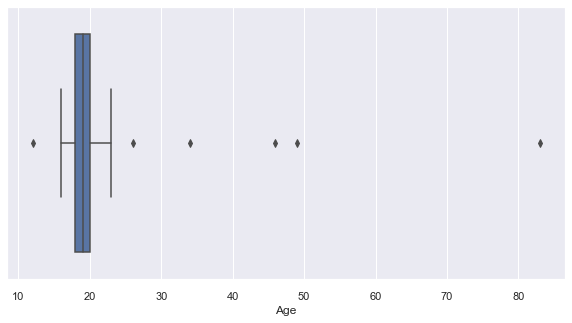

In [159]:
sns.set(rc={'figure.figsize':(10, 5)})
sns.boxplot(x = df["Age"])

#### *Inference*: We find that there are 6 outliers which do not fall in our area of research. So, we deal with each of them accordingly and drop the values which are supposed to be dropped.

In [160]:
df[df['Age']>25] 

,Age,Gender,State,SS1,SS2,SS3,SS4,SS5,SS6,SS7,...,R7,R8,R9,R10,R11,R12,SS Score,SS Status,R Score,R Status
14,83,Others,Andaman and Nicobar Islands,4,6,2,6,2,6,5,...,2,5,4,1,5,2,4.583333,Moderate,36,Developing
17,34,Male,Karnataka,6,5,3,3,5,6,5,...,4,3,5,5,4,5,4.500000,Moderate,53,Exceptional
20,46,Female,Gujarat,7,6,6,6,6,6,6,...,2,4,4,4,4,4,6.083333,High,42,Established
27,49,Female,Gujarat,3,7,6,6,7,6,6,...,4,2,4,5,4,4,5.833333,High,42,Established
93,26,Male,Karnataka,6,6,6,5,7,7,6,...,4,2,3,3,2,2,6.250000,High,31,Developing


In [161]:
# Changing the outlier value to its actual value
txt = df_original.iloc[14].Username
x = re.search('[a-zA-Z0-9\.]+@[a-z]{2,10}\.christuniversity.in', txt)

if x:
  print("It is a student.")

  var = txt.split("@")
  names = var[0]

  if df_original.iloc[14]['Are you comfortable sharing your information (Consent):'] == 'Yes':
    print("As the entry belongs to", names, ", filling the data manually here.")
    df['Age'] = df['Age'].replace(to_replace = 83, value = np.nan)
    df['Age'] = df['Age'].replace(to_replace = np.nan, value = round(df['Age'].mean()))
    print("Data Updated!")

  else:
    print("As the entry is anonymous filling the data manually here.")
    df['Age'] = df['Age'].replace(to_replace = 83, value = 22)

else: 
  print("It is not a student")

It is a student.
As the entry belongs to ricky.koppula , filling the data manually here.
Data Updated!


In [162]:
# Changing the outlier value to its actual value
txt = df_original.iloc[93].Username
x = re.search('[a-zA-Z0-9\.]+@[a-z]{2,10}\.christuniversity.in', txt)

if x:
  print("It is a student.\nThe Age is correct.")
else: 
  print("It is not a student")

It is a student.
The Age is correct.


In [163]:
# As this evaluation is based on the students, we notice that there are 3 entries which donot match the status of a student so, we drop these values

age_outliers = list(df['Age'].nlargest(2).index) + list(df['Age'].nsmallest(1).index)
df.drop(age_outliers, axis = 0, inplace = True)
df.reset_index(drop = True, inplace = True)

## 2. Count of elemets in each column

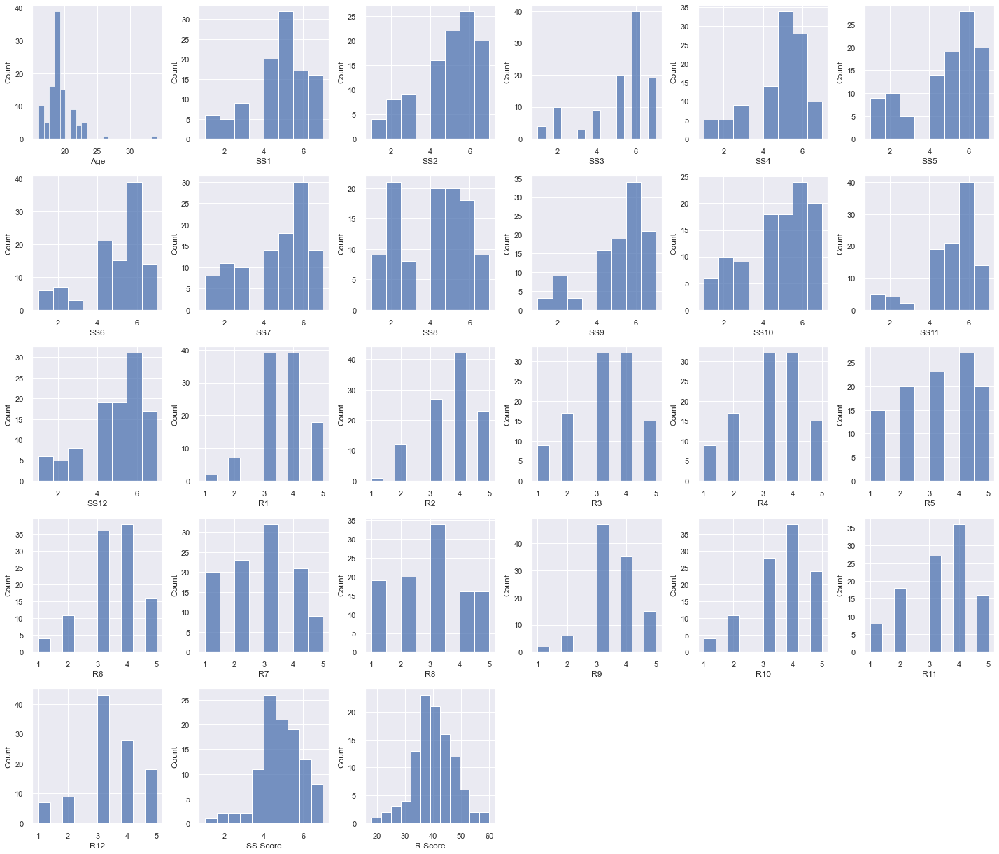

In [164]:
col_list = df.drop(['Gender', 'State', 'SS Status', 'R Status'], axis = 1)

plt.figure(figsize=(20,20))
column_list = col_list[2:]
plt_num = 1

for i in column_list:
    if plt_num<=18:
        plt.subplot(6, 6, plt_num)
        sns.histplot(df[i])
        plt_num = plt_num+1
    else:
        plt.subplot(6, 6, plt_num)
        sns.histplot(df[i])
        plt_num = plt_num+1
plt.tight_layout()

### *Inference*: From the above graph, we get a rough idea about the count in each column.

## 3. Percentage of people in each State

In [165]:
state_unique = list(df['State'].unique())

In [166]:
state_data = []
for i in range(len(state_unique)):
  state_data.append(len(df[df['State'] == state_unique[i]]))

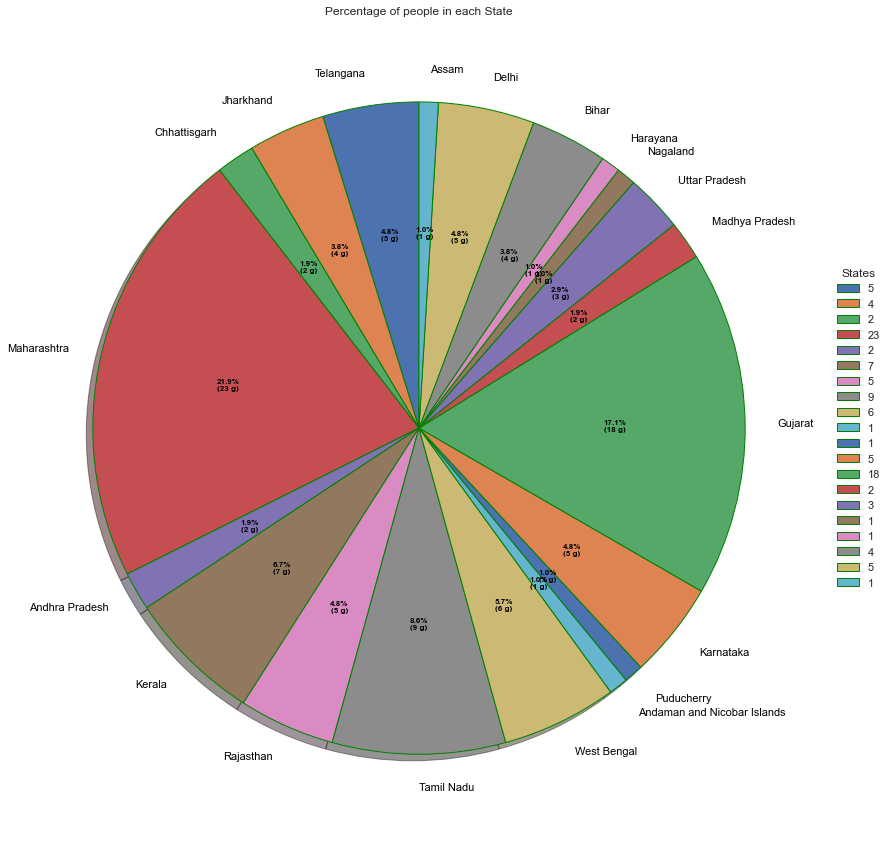

In [167]:
# Wedge properties
wp = { 'linewidth' : 1, 'edgecolor' : "green" }
 
# Creating autocpt arguments
def func(pct, allvalues):
    absolute = int(pct / 100.*np.sum(allvalues))
    return "{:.1f}%\n({:d} g)".format(pct, absolute)
 
# Creating plot
fig, ax = plt.subplots(figsize =(30, 15))
wedges, texts, autotexts = ax.pie(state_data,
                                  autopct = lambda pct: func(pct, state_data),
                                  labels = state_unique,
                                  shadow = True,
                                  startangle = 90,
                                  wedgeprops = wp,
                                  textprops = dict(color ="black"))
 
# Adding legend
ax.legend(wedges, state_data,
          title = "States",
          loc ="center left",
          bbox_to_anchor =(1, 0, 0.5, 1))
 
plt.setp(autotexts, size = 8, weight = "bold")
ax.set_title("Percentage of people in each State")
 
# show plot
plt.show()

#### *Inference*: We can see that majority of the people who filled the form belong to Maharashtra which is followed up people from Gujarat.

## 4. Number of people belonging to each gender

(array([46.,  0.,  0.,  0.,  0., 57.,  0.,  0.,  0.,  2.]),
 array([0. , 0.2, 0.4, 0.6, 0.8, 1. , 1.2, 1.4, 1.6, 1.8, 2. ]),
 <BarContainer object of 10 artists>)

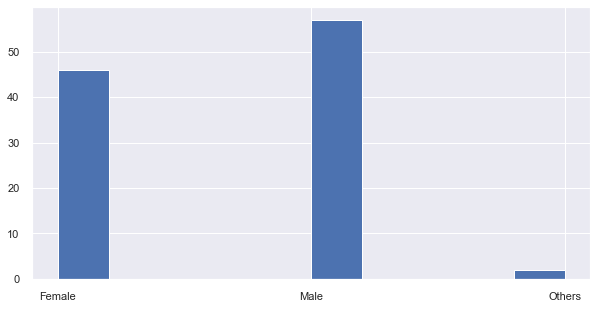

In [168]:
plt.hist(df['Gender'])

#### *Inference*: We can see that male to female ratio is tending more to the male side.

## 5. Percentage of People belonging in Each Social Support Category

In [169]:
ss_status_unique = list(df['SS Status'].unique())

In [170]:
ss_status_data = []
for i in range(len(ss_status_unique)):
  ss_status_data.append(len(df[df['SS Status'] == ss_status_unique[i]]))

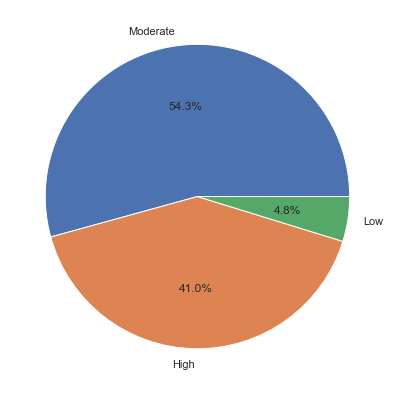

In [171]:
# Creating plot
fig = plt.figure(figsize =(10, 7))
plt.pie(ss_status_data, labels = ss_status_unique, autopct='%1.1f%%')
 
# show plot
plt.show()

#### *Inference*: Majority of the students fall under the 'Moderate' category in their Social Support domain.

## 6. Percentage of People belonging in Each Resilience Category

In [172]:
r_status_unique = list(df['R Status'].unique())

In [173]:
r_status_data = []
for i in range(len(r_status_unique)):
  r_status_data.append(len(df[df['R Status'] == r_status_unique[i]]))

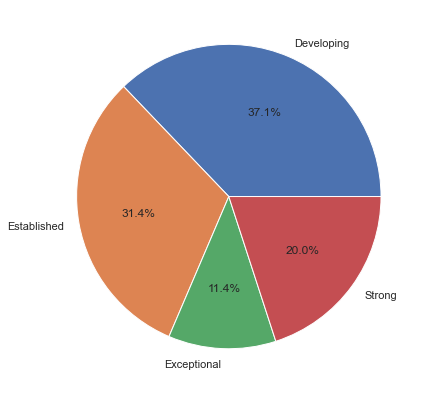

In [174]:
# Creating plot
fig = plt.figure(figsize =(10, 7))
plt.pie(r_status_data, labels = r_status_unique, autopct='%1.1f%%')
 
# show plot
plt.show()

#### *Inference*: We infer from the Graph that majority of them belong in the 'Developing' domain.

## 7. Correlation Heatmap

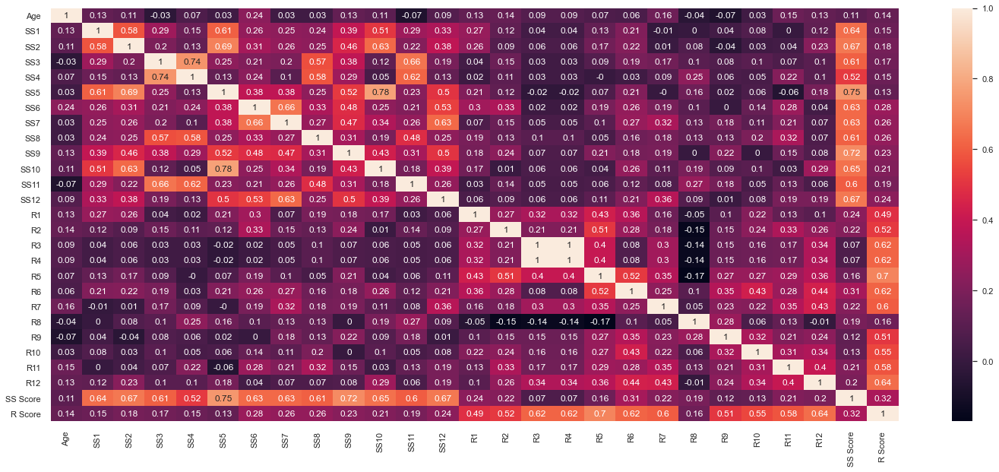

In [175]:
# Selecting columns with moderate to high correlation values
sns.set(rc={'figure.figsize':(25, 10)})
corr_map = sns.heatmap(df.corr().round(2), annot=True)

In [176]:
corr_matrix = df.corr()

features = []
for feature, value in corr_matrix['SS Score'].iteritems():
    if abs(value) >= 0.5:
        features.append(feature)
    else:
        pass

#### *Inference*: We observe that 12 variables, excludig 'SS Score' itself, have more than moderate and upto high correlation with 'SS Score'. In case of 'R Score', we only get 10 variables so, we get our target variable to be 'SS Score'.

## 8. SS Score vs R Score

<AxesSubplot:xlabel='SS Score', ylabel='R Score'>

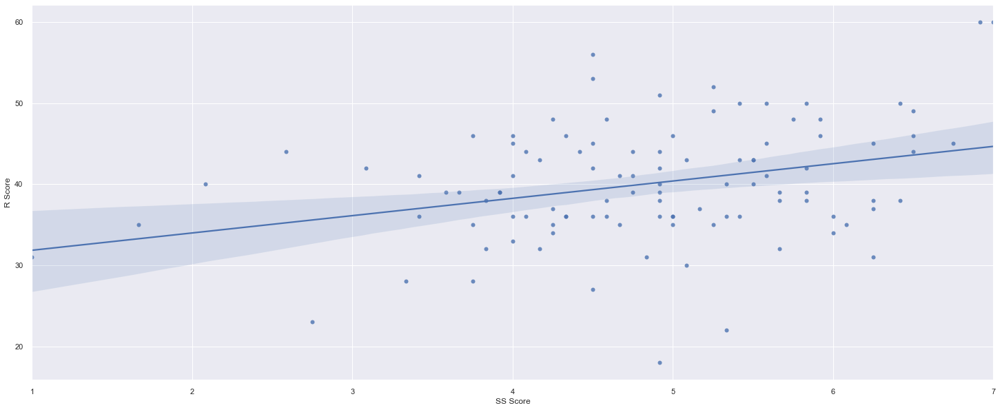

In [177]:
sns.regplot(data = df, x = 'SS Score', y = 'R Score')

#### *Inference*: It is observed that there is a slight linear relation between 'SS Score' and 'R Score'. (The same was hinted by the correlation heatmap)

## 9. SS Status vs Gender

In [178]:
gender_unique = list(df['Gender'].unique())

In [179]:
gender_unique

['Female', 'Male', 'Others']

In [180]:
ss_status_unique

['Moderate', 'High', 'Low']

In [181]:
gender_ss_label = ['Female_Mod', "Male_Mod", "Others_Mod", "Female_High", "Male_High", "Others_High", "Female_Low", "Male_Low", "Others_Low"]

In [182]:
gender_ss_data = []
for i in range(len(ss_status_unique)):
  for j in range(len(gender_unique)):
    gender_ss_data.append(len(df[(df['SS Status'] == ss_status_unique[i]) & (df['Gender']  == gender_unique[j])]))

<AxesSubplot:>

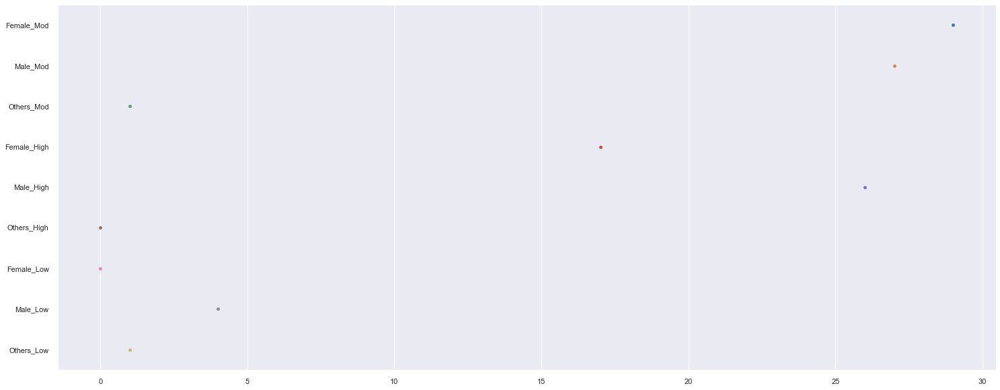

In [183]:
sns.swarmplot(x = gender_ss_data, y = gender_ss_label, palette = "deep")

#### *Inference*:  
#### Low Status count: Male > Others > Female  
#### Moderate Status count: Female > Male > Others  
#### High Status count: Male > Female > Others 

## 10. R Status vs Gender

In [184]:
gender_unique

['Female', 'Male', 'Others']

In [185]:
r_status_unique

['Developing', 'Established', 'Exceptional', 'Strong']

In [186]:
gender_r_label = ['Female_Dev', "Male_Dev", "Others_Dev", "Female_Est", "Male_Est", "Others_Est", "Female_Exc", "Male_Exc", "Others_Exc", "Female_Str", "Male_Str", "Others_Str"]

In [187]:
gender_r_data = []
for i in range(len(r_status_unique)):
  for j in range(len(gender_unique)):
    gender_r_data.append(len(df[(df['R Status'] == r_status_unique[i]) & (df['Gender']  == gender_unique[j])]))

<AxesSubplot:>

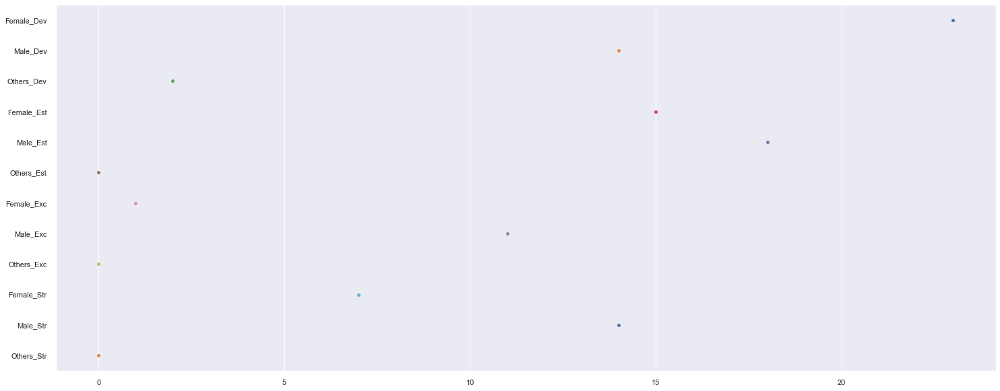

In [188]:
sns.swarmplot(x = gender_r_data, y = gender_r_label, palette = "deep")

#### *Inference*:  
#### Developing Status count: Female > Male > Others  
#### Established Status count: Male > Female > Others  
#### Strong Status count: Male > Female > Others  
#### Exceptional Status count: Male > Female > Others 

## 11. SS Score vs State

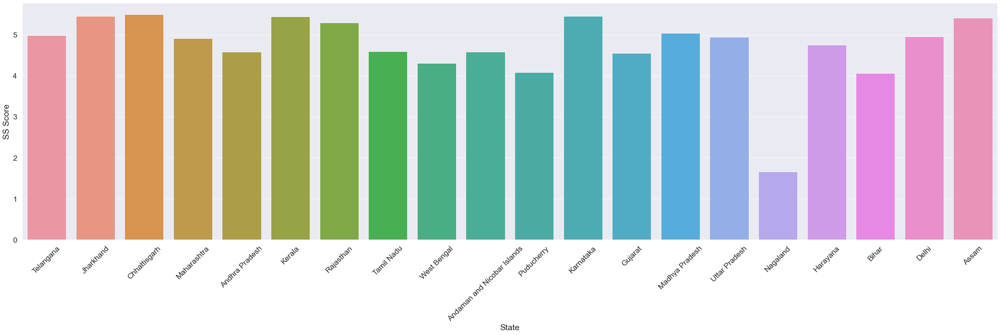

In [189]:
sns.set(rc={'figure.figsize':(40, 10)})
sns.set_context("paper", font_scale=2)                                                  
bar1 = sns.barplot(data = df, x = "State", y = "SS Score", ci = None)

for item in bar1.get_xticklabels():
    item.set_rotation(45)

#### *Inference*: It is observed that people from 'Chattisgarh' have high Social Support Score.

## 12. R Score vs State

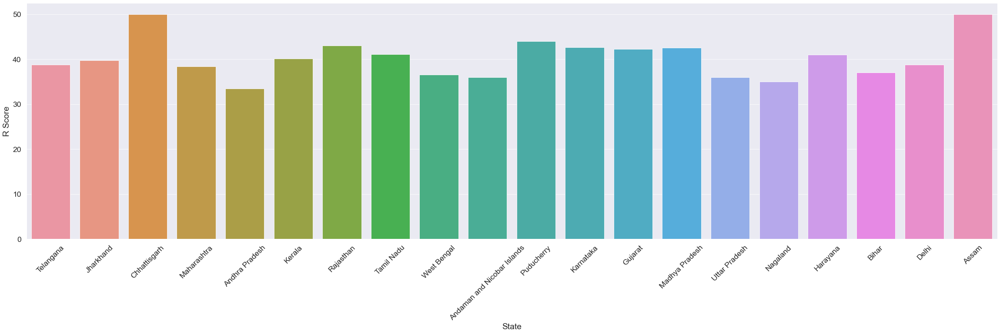

In [190]:
sns.set(rc={'figure.figsize':(40, 10)})
sns.set_context("paper", font_scale=2)                                                  
bar2 = sns.barplot(data = df, x = "State", y = "R Score", ci = None)

for item in bar2.get_xticklabels():
    item.set_rotation(45)

#### *Inference*: It is observed that people from 'Chattisgarh' and 'Assam' have high Resilience Support Score.

## 13. R Score vs State vs Gender

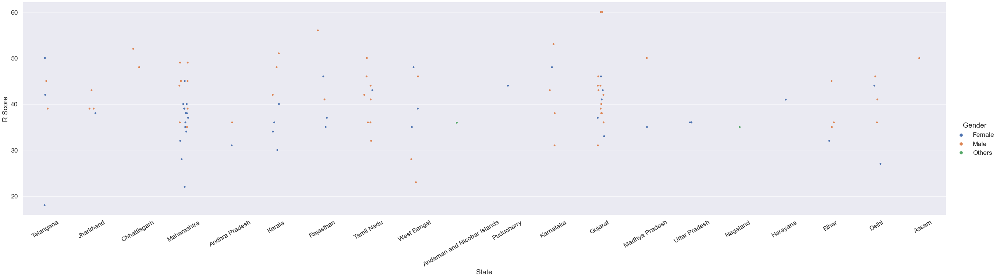

In [191]:
bar3 = sns.catplot(data = df, x = "State", y = "R Score", hue = 'Gender' , height = 9, aspect = 4, ci = None)
bar3.set_xticklabels(rotation=30)

#### *Inference*: It is observed that the highest R Score belongs to a Male from Gujarat whereas the lowest R Score belongs to a Female from Telengana.

## 14. SS Score vs State vs Gender

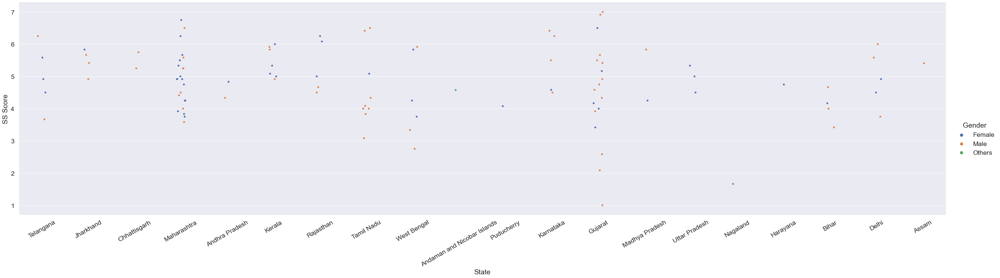

In [192]:
bar4 = sns.catplot(data = df, x = "State", y = "SS Score", hue = 'Gender' , height = 9, aspect = 4, ci = None)
bar4.set_xticklabels(rotation=30)

#### *Inference*: It is observed that the highest SS Score belongs to a Male from Gujarat whereas the lowest SS Score also belongs to a Male from Gujarat.

## 15. R Score on the Indian map

In [193]:
fig = px.choropleth(
    df,
    geojson = "https://gist.githubusercontent.com/jbrobst/56c13bbbf9d97d187fea01ca62ea5112/raw/e388c4cae20aa53cb5090210a42ebb9b765c0a36/india_states.geojson",
    featureidkey = 'properties.ST_NM',
    locations = 'State',
    color = 'R Score',
    color_continuous_scale='Reds',
    # mapbox_style="carto-positron",
)

fig.update_geos(fitbounds="locations", visible=False)

fig.show()

### *Inference*: The above graph shows the count of R Score in each State.

## 16. SS Score on the Indian map

In [194]:
fig = px.choropleth(
    df,
    geojson = "https://gist.githubusercontent.com/jbrobst/56c13bbbf9d97d187fea01ca62ea5112/raw/e388c4cae20aa53cb5090210a42ebb9b765c0a36/india_states.geojson",
    featureidkey = 'properties.ST_NM',
    locations = 'State',
    color = 'SS Score',
    color_continuous_scale='Reds',
    # mapbox_style="carto-positron",
)

fig.update_geos(fitbounds="locations", visible=False)

fig.show()

### *Inference*: The above graph shows the count of SS Score in each State.

# **Micro Exploratory Data Analysis**

## 1. Evaluating the rows on the basis of certain R Status 

In [195]:
# Creating user-defined functions for plotting graphs

# Skewness in a column
def checkSkewness(df, column_name):
  sns.set(rc={'figure.figsize':(7, 7)})
  sns.displot(data = df, x = column_name, kde = True)

# Count Plot a certain column
def countPlot(df, column_name):
  sns.countplot(data = df, x = column_name)

# Plot States for a certain subset
def plotState(df):
  sns.set(rc={'figure.figsize':(20, 7)})
  graph = sns.countplot(data = df, x = 'State')

  for item in graph.get_xticklabels():
      item.set_rotation(45)

# Plotting every possible combination of Regplots
def plotRegplot(df):
  ss = ['SS1', 'SS2', 'SS3', 'SS4', 'SS5', 'SS6', 'SS7', 'SS8', 'SS9', 'SS10', 'SS11', 'SS12']
  r = ['R1', 'R2', 'R3', 'R4', 'R5', 'R6', 'R7', 'R8', 'R9', 'R10', 'R11', 'R12']
  plt.figure(figsize=(50, 100))
  plt_num = 1

  for i in range(len(ss)):
    for j in range(len(r)):
        if plt_num<=18:
            plt.subplot(24, 6, plt_num)
            sns.regplot(data = df, x = ss[i], y = r[j])
            plt_num = plt_num+1
        else:
            plt.subplot(24, 6, plt_num)
            sns.regplot(data = df, x = ss[i], y = r[j])
            plt_num = plt_num+1
  plt.tight_layout(h_pad = 5, w_pad = 10)

In [196]:
# Creating subsets from the original df with only one R Status at a time
r_developing = df_clean[df_clean['R Status'] == 'Developing']
r_established = df_clean[df_clean['R Status'] == 'Established']
r_exceptional = df_clean[df_clean['R Status'] == 'Exceptional']
r_strong = df_clean[df_clean['R Status'] == 'Strong']

## 1.1) R_developing

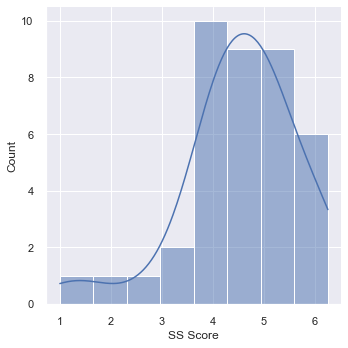

In [197]:
checkSkewness(r_developing, 'SS Score')

### *Inference*: The SS score is left skewed when R_status = 'Developing'.

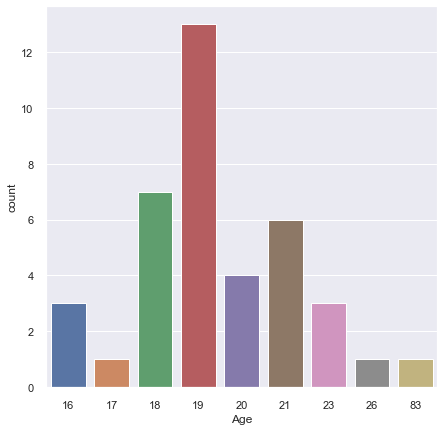

In [198]:
countPlot(r_developing, 'Age')

### *Inference*: When R_status = 'Developing', maximum students are of age 19.

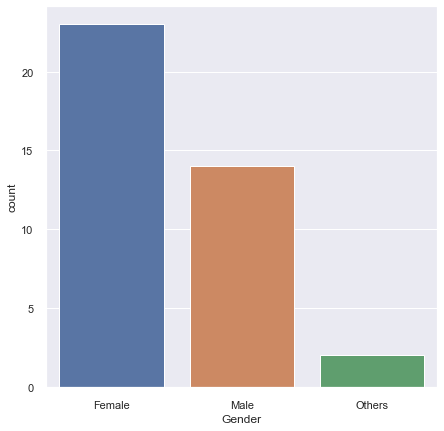

In [199]:
countPlot(r_developing, 'Gender')

### *Inference*: When R_status = 'Developing', maximum students are Female.

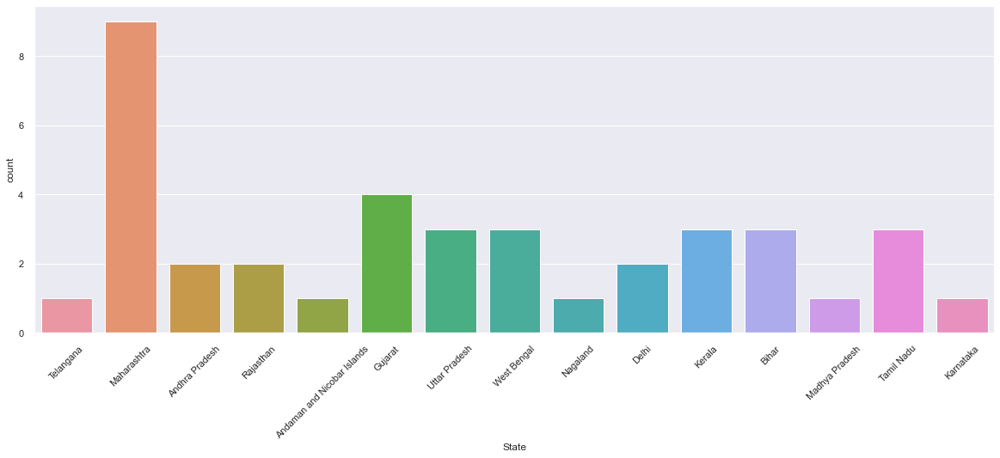

In [200]:
plotState(r_developing)

### *Inference*: When R_status = 'Developing', maximum students belong to Maharashtra.

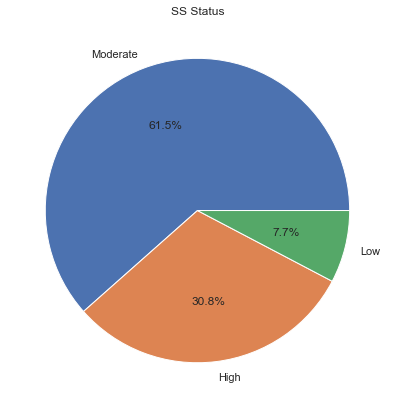

In [201]:
ss_status_data = []
for i in range(len(ss_status_unique)):
  ss_status_data.append(len(r_developing[r_developing['SS Status'] == ss_status_unique[i]]))

# Creating plot
fig = plt.figure(figsize =(10, 7))
plt.title('SS Status')
plt.pie(ss_status_data, labels = ss_status_unique, autopct='%1.1f%%')
 
# show plot
plt.show()

### *Inference*: When R_status = 'Developing', maximum students belong to 'Moderate' category under SS_status.

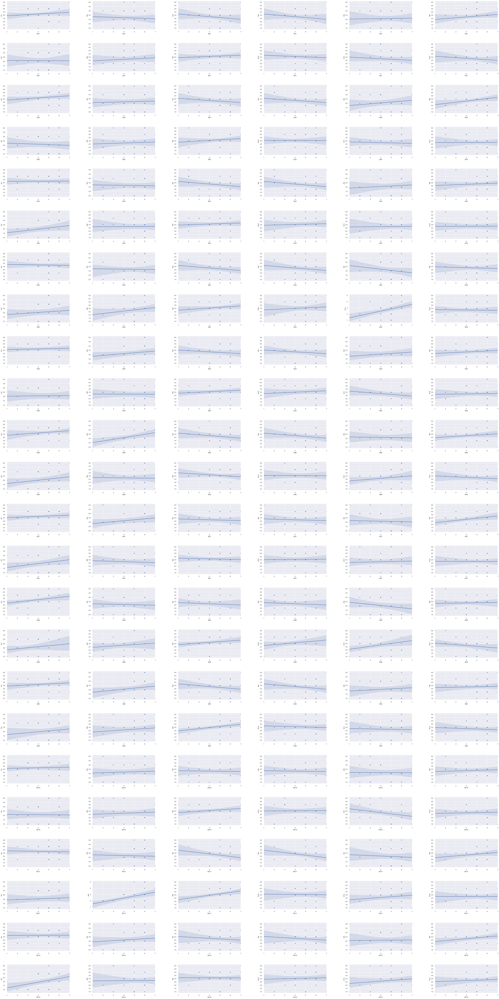

In [202]:
plotRegplot(r_developing)

### *Inference*: When R_status = 'Developing', following are the linear/no-linear dependencies between SS and R variables.

## 1.2) R_established

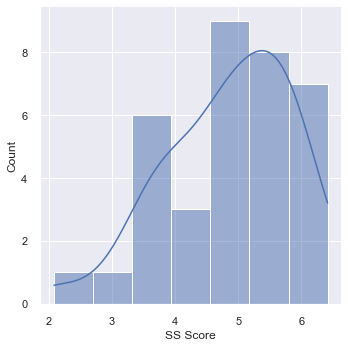

In [203]:
checkSkewness(r_established, 'SS Score')

### *Inference*: When R_status = 'Established', SS score is left skewed.

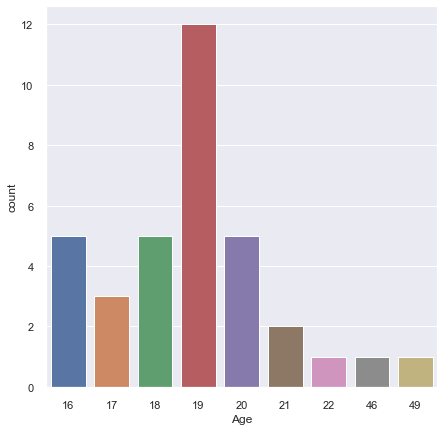

In [204]:
countPlot(r_established, 'Age')

### *Inference*: When R_status = 'Established', maximum students are of age 19.

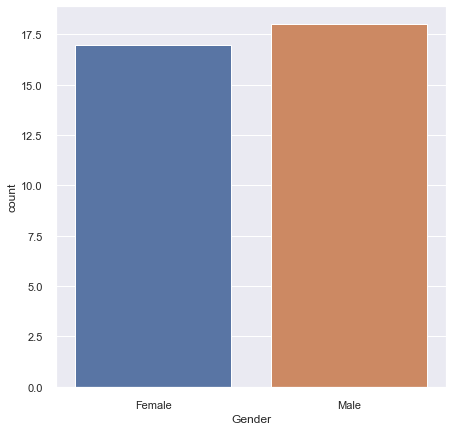

In [205]:
countPlot(r_established, 'Gender')

### *Inference*: When R_status = 'Established', maximum students are male.

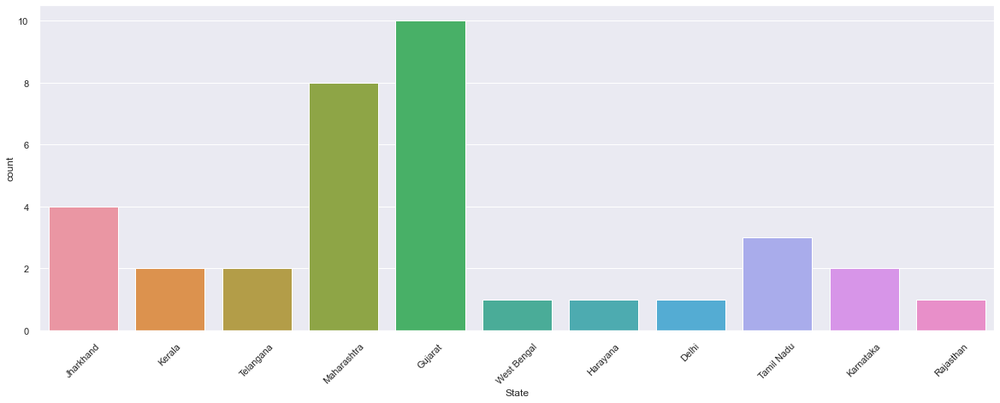

In [206]:
plotState(r_established)

### *Inference*: When R_status = 'Established', maximum students belong to Gujarat.

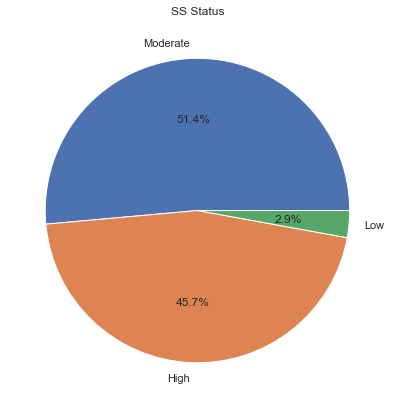

In [207]:
ss_status_data = []
for i in range(len(ss_status_unique)):
  ss_status_data.append(len(r_established[r_established['SS Status'] == ss_status_unique[i]]))

# Creating plot
fig = plt.figure(figsize =(10, 7))
plt.title('SS Status')
plt.pie(ss_status_data, labels = ss_status_unique, autopct='%1.1f%%')
 
# show plot
plt.show()

### *Inference*: When R_status = 'Established', maximum students belong to 'Moderate' under SS status.

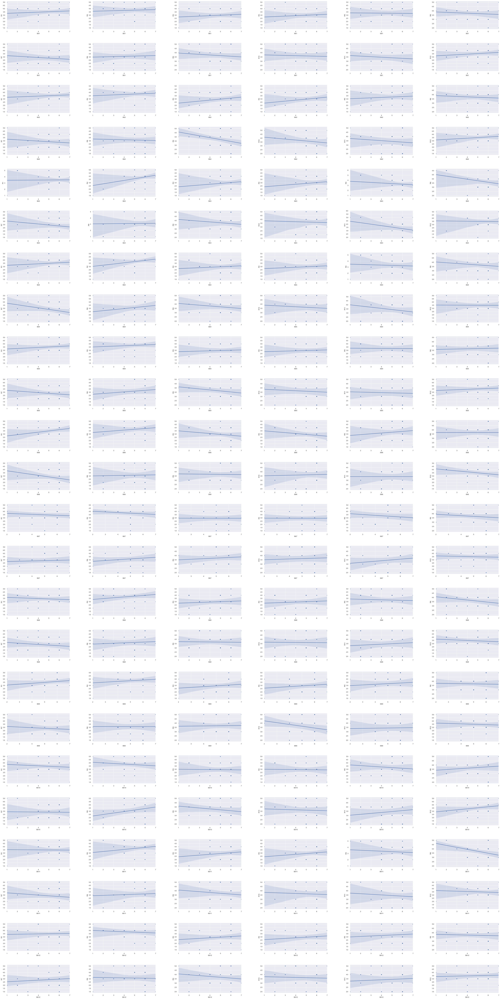

In [208]:
plotRegplot(r_established)

### *Inference*: When R_status = 'Established', following are the linear/non-linear dependencies between SS and R variables.

## 1.3) R_exceptinoal

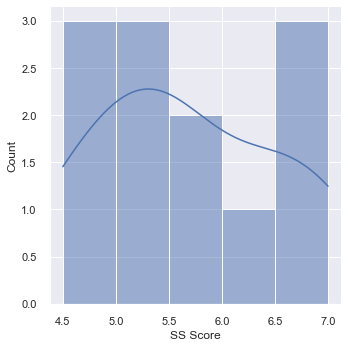

In [209]:
checkSkewness(r_exceptional, 'SS Score')

### *Inference*: When R_status = 'Established', SS score is almost normally distributed.

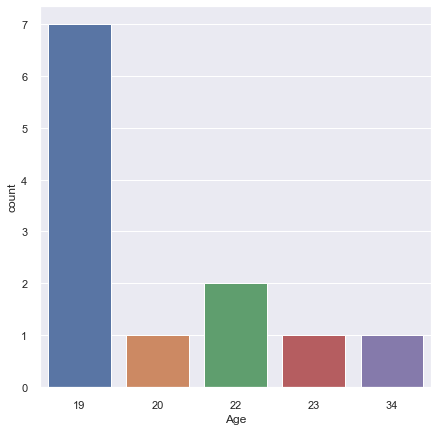

In [210]:
countPlot(r_exceptional, 'Age')

### *Inference*: When R_status = 'Established', maximum students are of age 19.

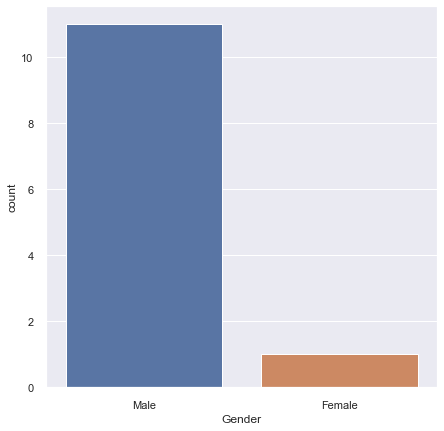

In [211]:
countPlot(r_exceptional, 'Gender')

### *Inference*: When R_status = 'Established', maximum students are Male.

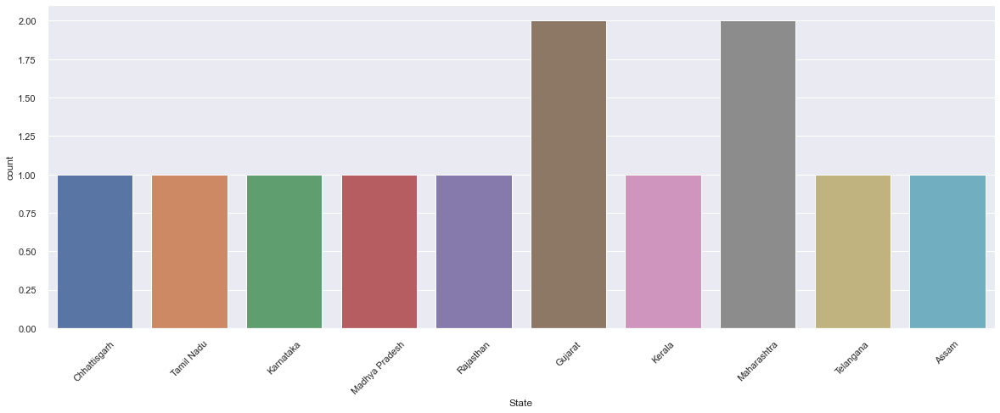

In [212]:
plotState(r_exceptional)

### *Inference*: When R_status = 'Established', maximum students belong to Gujarat and Maharashtra.

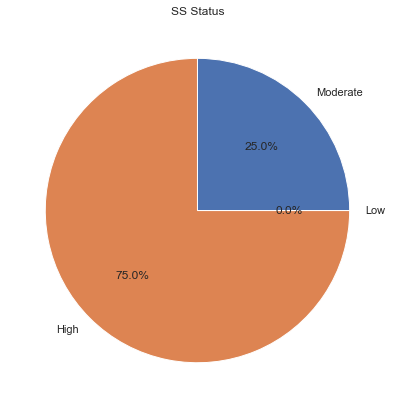

In [213]:
ss_status_data = []
for i in range(len(ss_status_unique)):
  ss_status_data.append(len(r_exceptional[r_exceptional['SS Status'] == ss_status_unique[i]]))

# Creating plot
fig = plt.figure(figsize =(10, 7))
plt.title('SS Status')
plt.pie(ss_status_data, labels = ss_status_unique, autopct='%1.1f%%')
 
# show plot
plt.show()

### *Inference*: When R_status = 'Established', maximum students belong to 'High' Status under SS status.

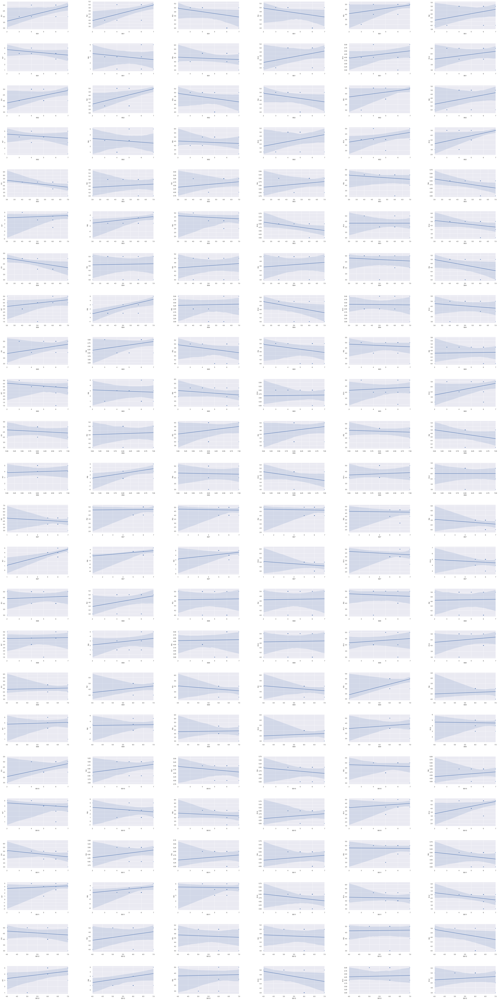

In [214]:
plotRegplot(r_exceptional)

### *Inference*: When R_status = 'Established', following are the linear/non-linear dependencies between SS and R varibales.

## 1.4) R_strong

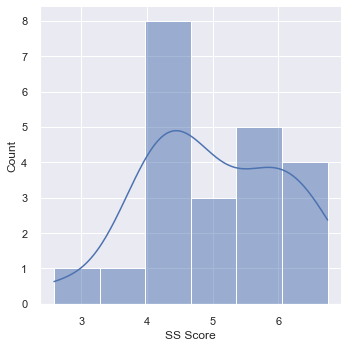

In [215]:
checkSkewness(r_strong, 'SS Score')

### *Inference*: When R_status = 'Strong', SS score is almost normally distributed.

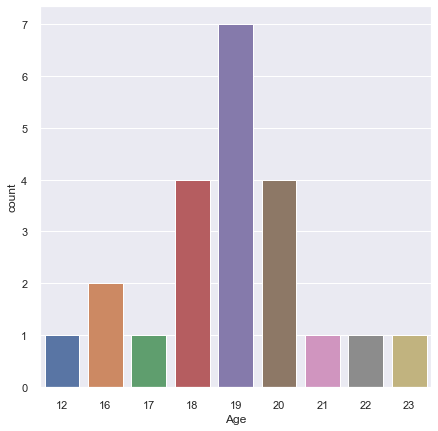

In [216]:
countPlot(r_strong, 'Age')

### *Inference*: When R_status = 'Strong', maximum students are of age 19.

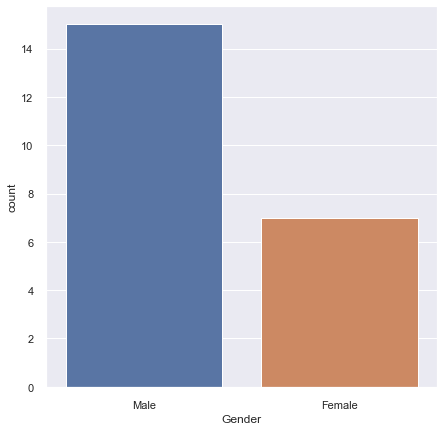

In [217]:
countPlot(r_strong, 'Gender')

### *Inference*: When R_status = 'Strong', maximum students are Male.

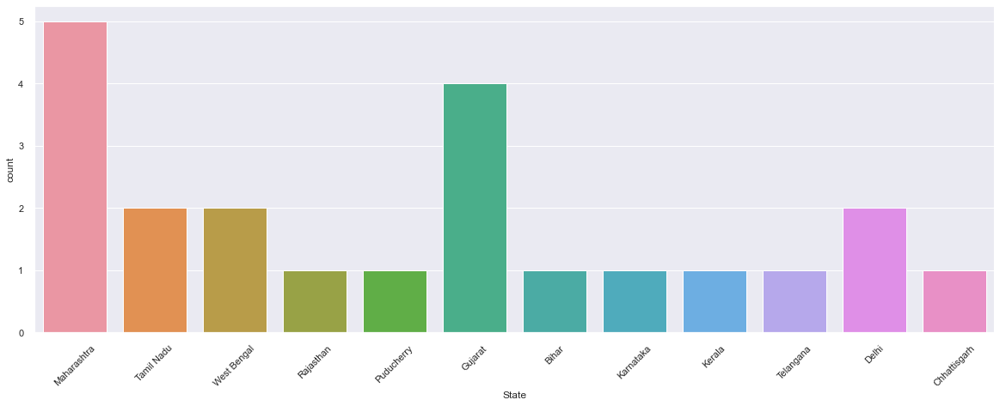

In [218]:
plotState(r_strong)

### *Inference*: When R_status = 'Strong', maximum students belong to Maharahstra.

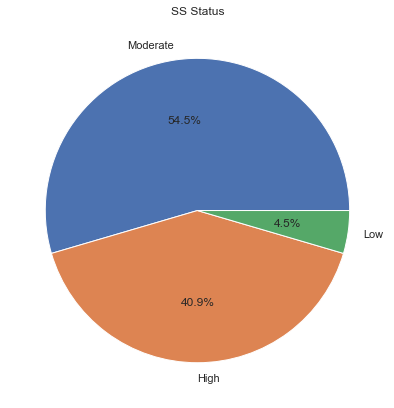

In [219]:
ss_status_data = []
for i in range(len(ss_status_unique)):
  ss_status_data.append(len(r_strong[r_strong['SS Status'] == ss_status_unique[i]]))

# Creating plot
fig = plt.figure(figsize =(10, 7))
plt.title('SS Status')
plt.pie(ss_status_data, labels = ss_status_unique, autopct='%1.1f%%')
 
# show plot
plt.show()

### *Inference*: When R_status = 'Strong', maximum students belong to 'Moderate' under SS status.

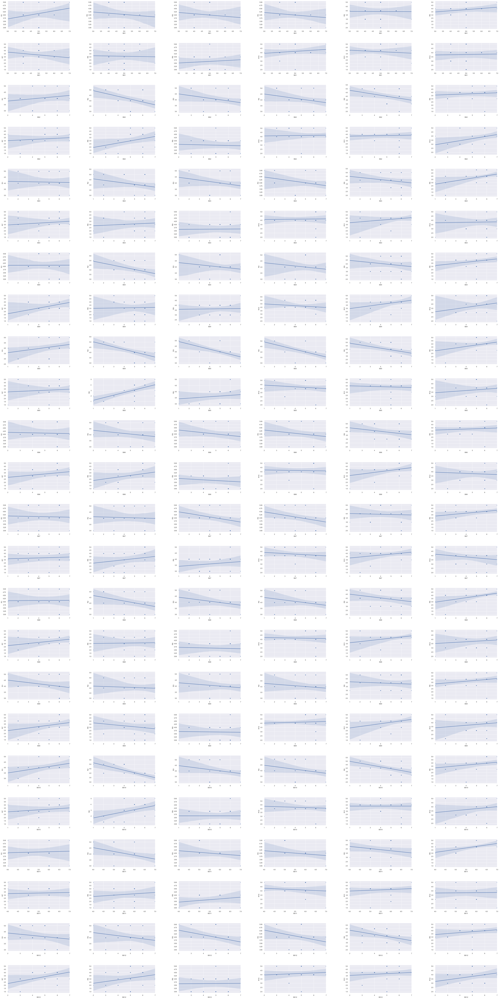

In [220]:
plotRegplot(r_strong)

### *Inference*: When R_status = 'Strong', following are the linear/non-linear dependencies of SS and R variables.

## 2. Evaluating the rows on the basis of certain SS Status 

In [221]:
# Creating subsets from the original df with only one SS Status at a time
ss_high = df_clean[df_clean['SS Status'] == 'High']
ss_moderate = df_clean[df_clean['SS Status'] == 'Moderate']
ss_low = df_clean[df_clean['SS Status'] == 'Low']

## 2.1) SS_high

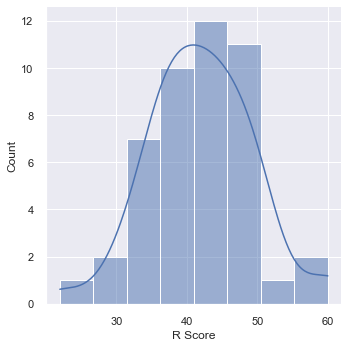

In [222]:
checkSkewness(ss_high, 'R Score')

### *Inference*: When SS_status = 'High', R score is almost normally distributed.

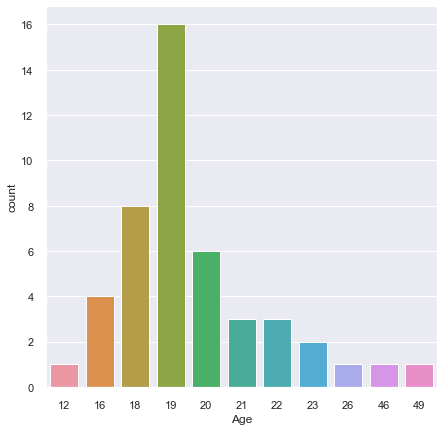

In [223]:
countPlot(ss_high, 'Age')

### *Inference*: When SS_status = 'High', maximum students are of age 19.

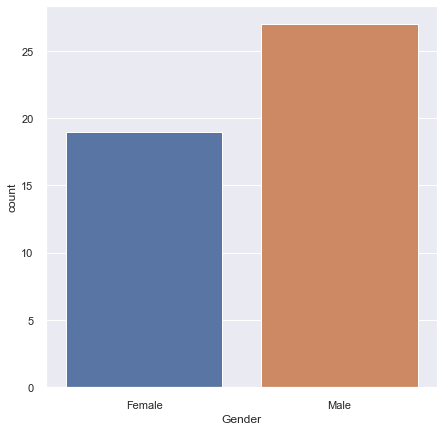

In [224]:
countPlot(ss_high, 'Gender')

### *Inference*: When SS_status = 'High', maximum students are Male.

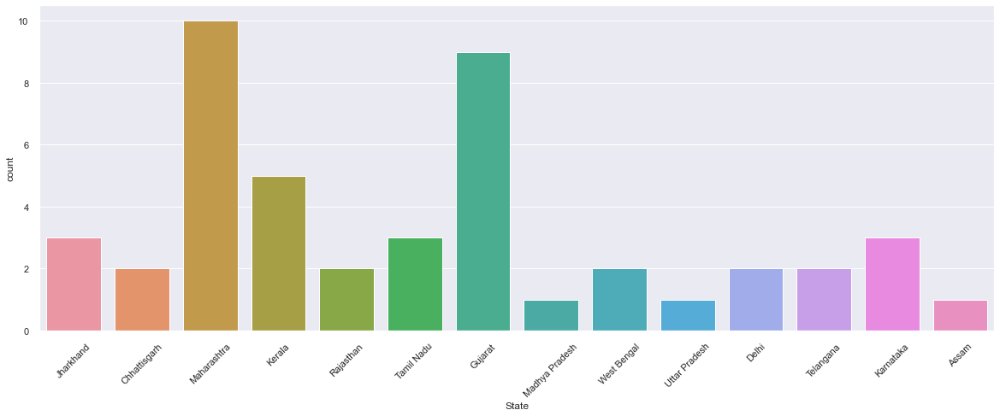

In [225]:
plotState(ss_high)

### *Inference*: When SS_status = 'High', maximum students belong to Maharashtra.

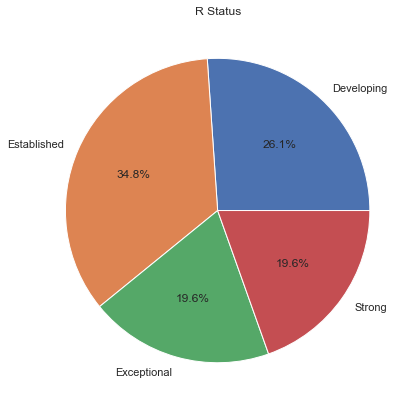

In [226]:
r_status_data = []
for i in range(len(r_status_unique)):
  r_status_data.append(len(ss_high[ss_high['R Status'] == r_status_unique[i]]))

# Creating plot
fig = plt.figure(figsize =(10, 7))
plt.title('R Status')
plt.pie(r_status_data, labels = r_status_unique, autopct='%1.1f%%')
 
# show plot
plt.show()

### *Inference*: When SS_status = 'High', maximum students belong to 'Established' under R Status.

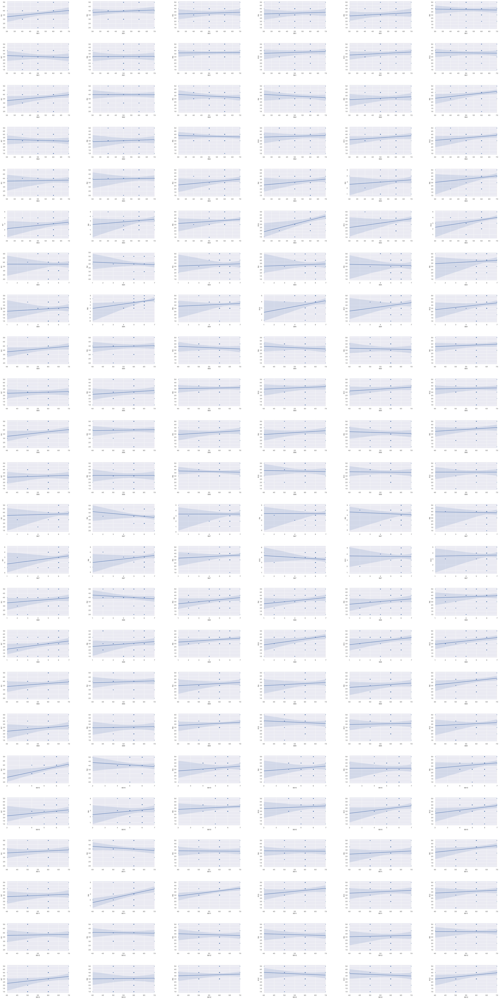

In [227]:
plotRegplot(ss_high)

### *Inference*: When SS_status = 'High', following are the linear/non-linear dependencies between R and SS variables.

## 2.2) SS_moderate

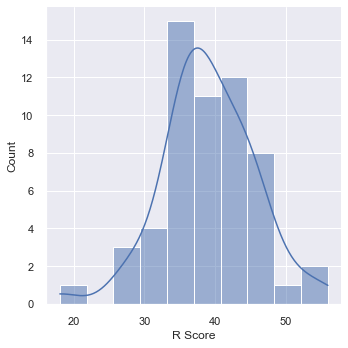

In [228]:
checkSkewness(ss_moderate, 'R Score')

### *Inference*: When SS_status = 'High', R score is normally distributed.

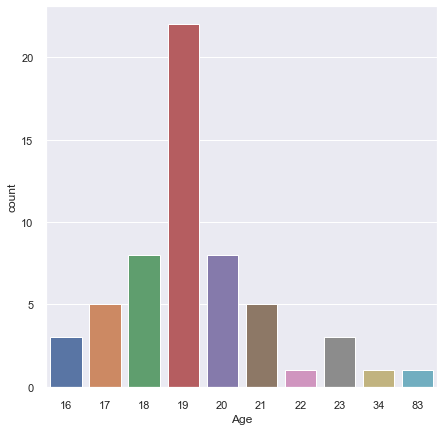

In [229]:
countPlot(ss_moderate, 'Age')

### *Inference*: When SS_status = 'High', maximum students are of age 19

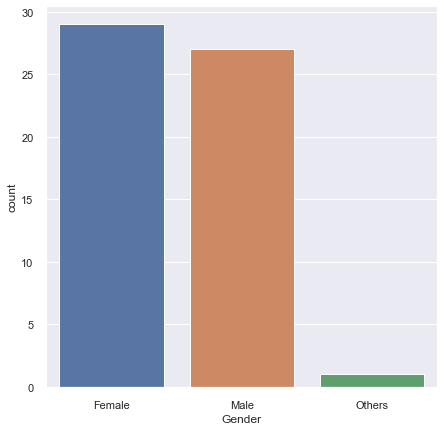

In [230]:
countPlot(ss_moderate, 'Gender')

### *Inference*: When SS_status = 'High', maximum students are Female.

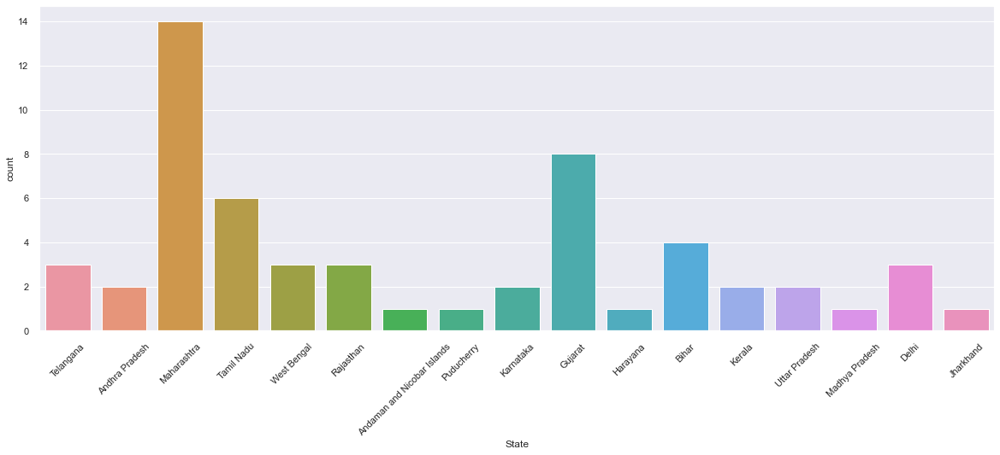

In [231]:
plotState(ss_moderate)

### *Inference*: When SS_status = 'High', maximum students belong to Maharashtra.

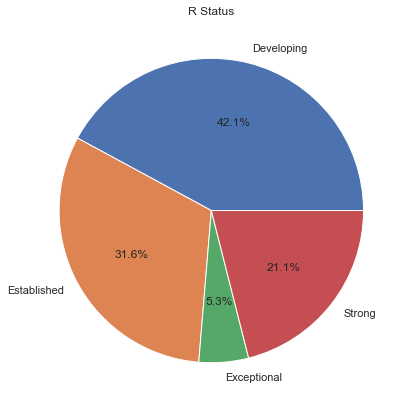

In [232]:
r_status_data = []
for i in range(len(r_status_unique)):
  r_status_data.append(len(ss_moderate[ss_moderate['R Status'] == r_status_unique[i]]))

# Creating plot
fig = plt.figure(figsize =(10, 7))
plt.title('R Status')
plt.pie(r_status_data, labels = r_status_unique, autopct='%1.1f%%')
 
# show plot
plt.show()

### *Inference*: When SS_status = 'High', maximum students belong to 'Developing' under R status.

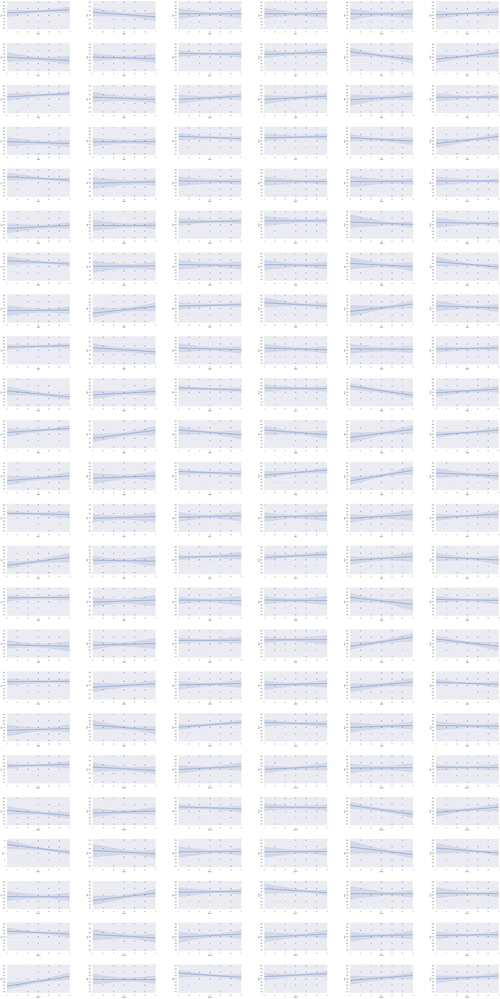

In [233]:
plotRegplot(ss_moderate)

### *Inference*: When SS_status = 'High', following are the linear/non-linear dependencies between R and SS variables.

## 2.3) SS_low

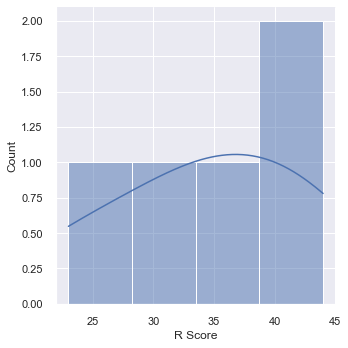

In [234]:
checkSkewness(ss_low, 'R Score')

### *Inference*: When SS_status = 'Low', R score is normally distributed.

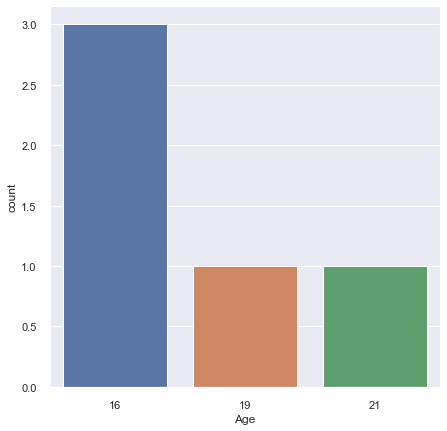

In [235]:
countPlot(ss_low, 'Age')

### *Inference*: When SS_status = 'Low', maximum students are of age 16.

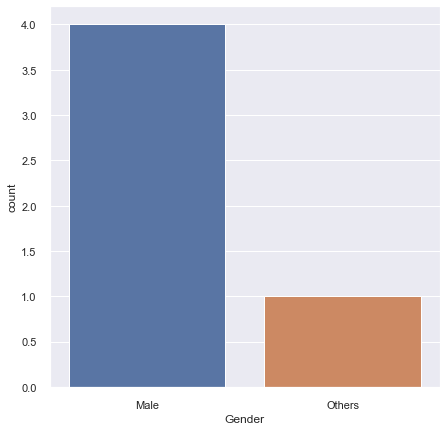

In [236]:
countPlot(ss_low, 'Gender')

### *Inference*: When SS_status = 'Low', maximum students are Male.

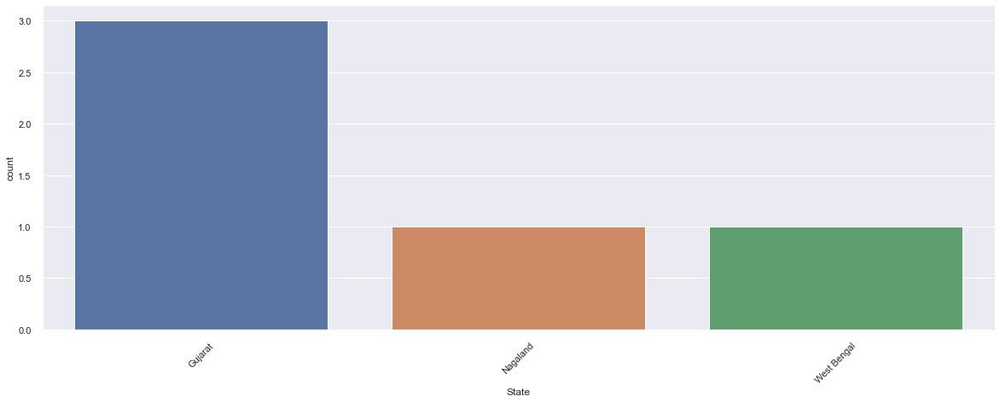

In [237]:
plotState(ss_low)

### *Inference*: When SS_status = 'Low', maximum students are from Gujarat.

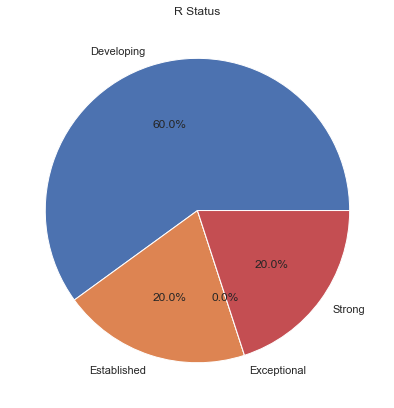

In [238]:
r_status_data = []
for i in range(len(r_status_unique)):
  r_status_data.append(len(ss_low[ss_low['R Status'] == r_status_unique[i]]))

# Creating plot
fig = plt.figure(figsize =(10, 7))
plt.title('R Status')
plt.pie(r_status_data, labels = r_status_unique, autopct='%1.1f%%')
 
# show plot
plt.show()

### *Inference*: When SS_status = 'Low', maximum students belong to 'Developing' under R status.

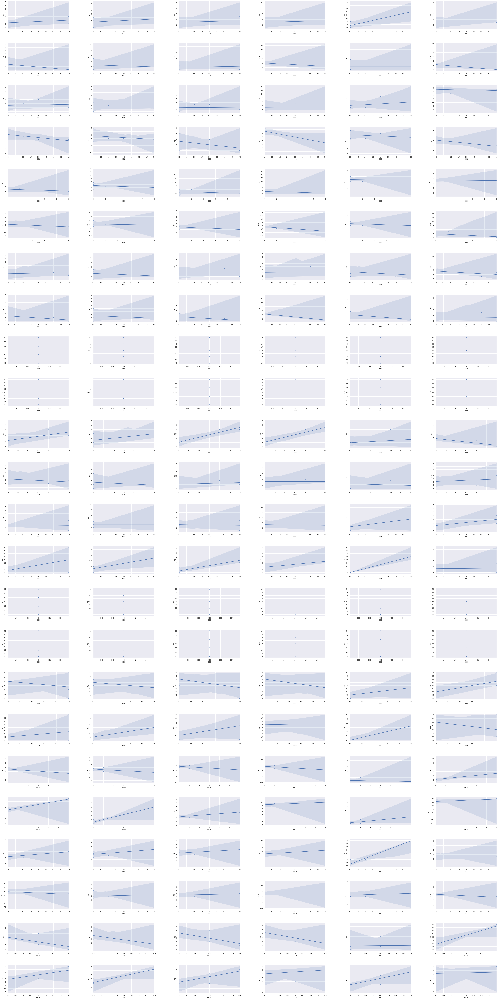

In [239]:
plotRegplot(ss_low)

### *Inference*: When SS_status = 'Low', following are the linear/non-linear dependencies between R and SS variables.

# Pre-Processing

In [240]:
# Label Encoding the Gender column
# Label Encoding turns categorical values to numerical values by mapping each unique value to a number

gender_le = LabelEncoder()
df['Gender'] = gender_le.fit_transform(df['Gender'])

'''
Female --> 0
Male --> 1
Others --> 2
'''

'\nFemale --> 0\nMale --> 1\nOthers --> 2\n'

In [241]:
# Label Encoding the State column
state_le = LabelEncoder()
df['State'] = state_le.fit_transform(df['State'])

In [242]:
# One-Hot Encoding the "SS Status" column
# One-Hot Encoding takes all the unique values of a column and splits those into different columns

one_hot_encoder_ss_status = OneHotEncoder()
ss_status_reshaped = np.array(df['SS Status']).reshape(-1, 1)
ss_status_values = one_hot_encoder_ss_status.fit_transform(ss_status_reshaped)

ss_status_col = df['SS Status'].unique()
ss_status_df = pd.DataFrame(ss_status_values.toarray(), columns = ss_status_col)

df = pd.concat([df, ss_status_df], axis = 1)
df = df.drop(['SS Status'], axis = 1)

In [243]:
# One-Hot Encoding the "SS Status" column
# One-Hot Encoding takes all the unique values of a column and splits those into different columns

one_hot_encoder_r_status = OneHotEncoder()
r_status_reshaped = np.array(df['R Status']).reshape(-1, 1)
r_status_values = one_hot_encoder_r_status.fit_transform(r_status_reshaped)

r_status_col = df['R Status'].unique()
r_status_df = pd.DataFrame(r_status_values.toarray(), columns = r_status_col)

df = pd.concat([df, r_status_df], axis = 1)
df = df.drop(['R Status'], axis = 1)

In [244]:
# Replacing a column to a certain position

def moveColumn(df, column_name, position):
  column_to_move = df.pop(column_name)
  df.insert(position, column_name, column_to_move)

In [245]:
moveColumn(df, 'R Score', 31)

In [246]:
df

,Age,Gender,State,SS1,SS2,SS3,SS4,SS5,SS6,SS7,...,R12,SS Score,Moderate,High,Low,R Score,Developing,Established,Exceptional,Strong
0,19.0,0,17,5,3,6,5,4,6,5,...,1,4.916667,0.0,0.0,1.0,18,1.0,0.0,0.0,0.0
1,19.0,0,8,4,6,6,6,6,6,6,...,3,5.833333,1.0,0.0,0.0,38,0.0,1.0,0.0,0.0
2,19.0,1,4,4,5,7,6,4,5,5,...,4,5.250000,1.0,0.0,0.0,52,0.0,0.0,1.0,0.0
3,19.0,1,12,5,6,6,6,6,6,6,...,3,5.250000,1.0,0.0,0.0,35,1.0,0.0,0.0,0.0
4,19.0,1,1,6,4,6,4,4,4,4,...,4,4.333333,0.0,0.0,1.0,36,1.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
100,21.0,1,19,5,5,6,5,1,1,1,...,2,2.750000,0.0,1.0,0.0,23,1.0,0.0,0.0,0.0
101,20.0,1,2,7,4,6,4,6,6,6,...,3,5.416667,1.0,0.0,0.0,50,0.0,0.0,1.0,0.0
102,19.0,1,6,7,7,7,7,7,7,7,...,5,7.000000,1.0,0.0,0.0,60,0.0,0.0,1.0,0.0
103,16.0,1,6,1,1,1,1,1,1,5,...,5,2.083333,0.0,1.0,0.0,40,0.0,1.0,0.0,0.0


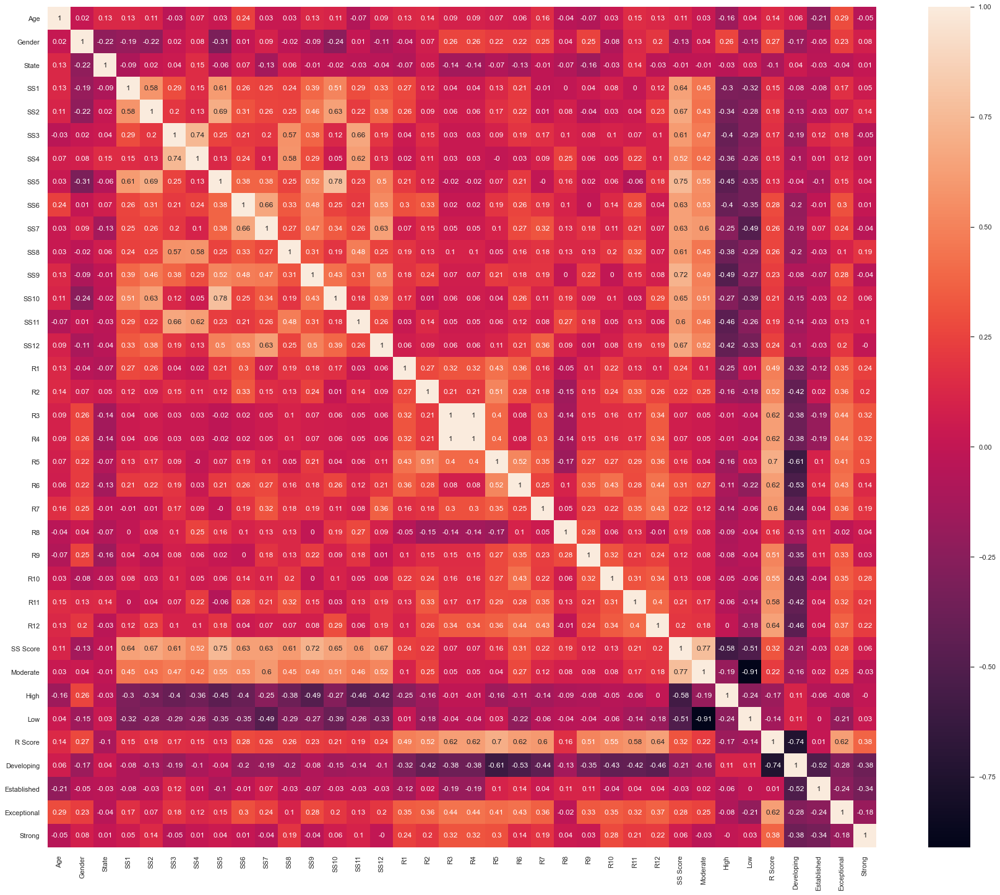

In [247]:
# Selecting columns with moderate to high correlation values
sns.set(rc={'figure.figsize':(30, 25)})
corr_map = sns.heatmap(df.corr().round(2), annot=True)

In [248]:
corr_matrix = df.corr()

features = []
for feature, value in corr_matrix['R Score'].iteritems():
    if abs(value) >= 0.1:
        features.append(feature)
    else:
        pass

In [249]:
del features[14:26]

In [250]:
del features[18:22]

In [251]:
features

['Age',
 'Gender',
 'SS1',
 'SS2',
 'SS3',
 'SS4',
 'SS5',
 'SS6',
 'SS7',
 'SS8',
 'SS9',
 'SS10',
 'SS11',
 'SS12',
 'SS Score',
 'Moderate',
 'High',
 'Low']

# **Linear Regression Model**

In [252]:
# Splitting the data into Features and Targets

X = df[features] 
y = df['R Score'] 

# X --> Features
# y --> Target Variable

In [253]:
# Splitting the data into training data and testing data

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 5)
linear_regressor = LinearRegression()

In [254]:
# Fitting the Data
linear_regressor.fit(X_train, y_train)

# Predicting the Target Variable
y_pred0 = linear_regressor.predict(X_test)

### Regression Plot

C:\Users\Lenovo\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



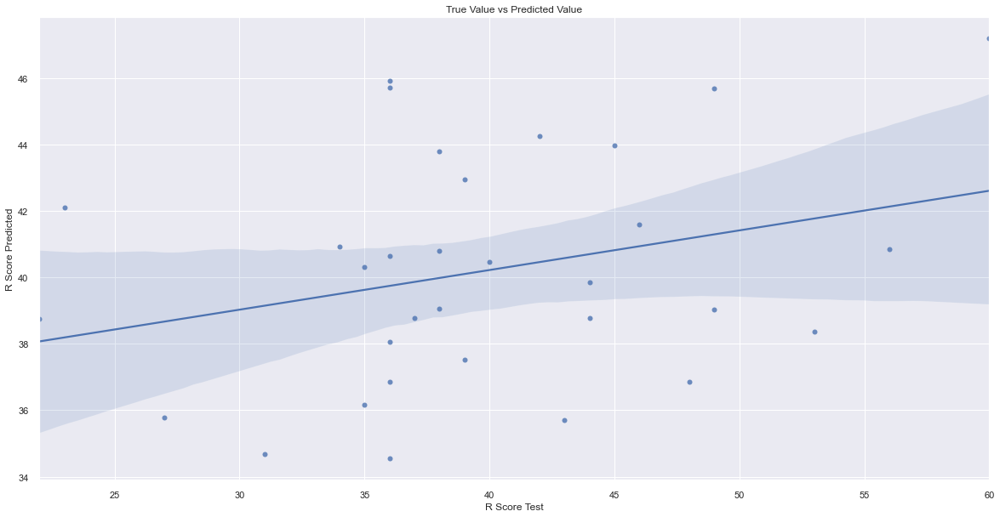

In [255]:
# Plotting the true and predicted value 
fig = plt.figure(figsize =(20, 10))
sns.regplot(y_test, y_pred0)
plt.xlabel("R Score Test")
plt.ylabel("R Score Predicted")
plt.title("True Value vs Predicted Value")
plt.show()

C:\Users\Lenovo\anaconda3\lib\site-packages\sklearn\base.py:409: UserWarning:

X does not have valid feature names, but LinearRegression was fitted with feature names



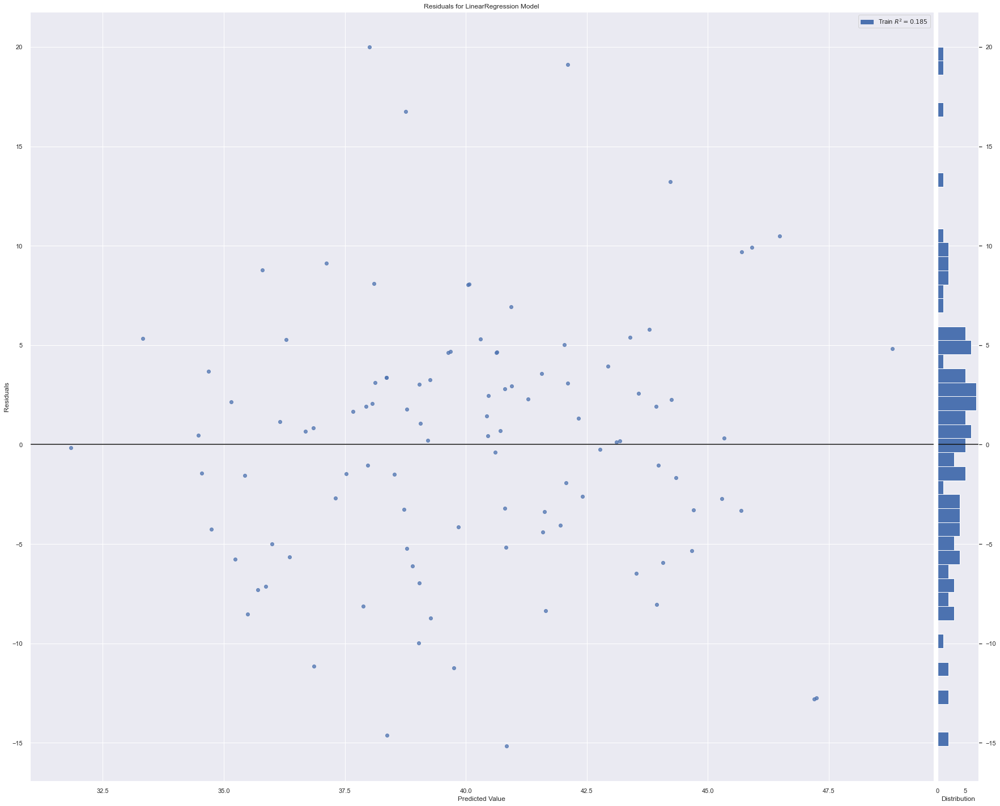

<AxesSubplot:title={'center':'Residuals for LinearRegression Model'}, xlabel='Predicted Value', ylabel='Residuals'>

In [256]:
# Predicted Valule vs Residuals
visualizer = ResidualsPlot(estimator = linear_regressor)
visualizer.fit(X, y) 
visualizer.poof()

### Accuracy Count

In [257]:
# Chcking the accuracy of the model 
print("The accuracy of the model is", linear_regressor.score(X_test, y_test))
print("The r2 score of the model is", r2_score(y_test, y_pred0))

The accuracy of the model is 0.07131779305961783
The r2 score of the model is 0.07131779305961783


### Evaluation Metrics

In [258]:
# Evaluation Metrics
print("The Absolute Mean Error of the model is", mean_absolute_error(y_test, y_pred0))
print("The Mean Squared Error of the model is", mean_squared_error(y_test, y_pred0))

The Absolute Mean Error of the model is 6.219502565177295
The Mean Squared Error of the model is 64.49897448768851


In [259]:
# Intercept of the model
intercept = linear_regressor.intercept_

# Coefficeints of the model
m = linear_regressor.coef_

In [260]:
print("The intercept of the model is", intercept, "\n\nThe weights of the features are as follows:\n", m)

The intercept of the model is 28.400182943463765 

The weights of the features are as follows:
 [-0.10489657  3.53723124  0.32173434  1.06896756  0.44725091 -0.44803586
 -1.22183026  0.49078693 -0.35375596  0.46968798  0.03460026  0.6751936
  0.40817922  0.47759282  0.19753096 -0.66956784  1.85206196 -1.18249412]


In [261]:
# Equation of the model

def predictRScore(regressor, x):
  intercept = regressor.intercept_
  weights = regressor.coef_
  equation = 0

  for i in range(len(weights)):
      equation += (weights[i]*x[i])
  equation += intercept
  print("The R Score is " + str(equation))

### Increasing the accuracy of the model

In [262]:
model = DecisionTreeRegressor()

regr_transformed = TransformedTargetRegressor(regressor = model, transformer=QuantileTransformer(output_distribution='normal'))
regr_transformed.fit(X_train, y_train)
y_pred1 = regr_transformed.predict(X_test)

C:\Users\Lenovo\anaconda3\lib\site-packages\sklearn\preprocessing\_data.py:2623: UserWarning:

n_quantiles (1000) is greater than the total number of samples (73). n_quantiles is set to n_samples.



In [263]:
print("The accuracy of the model is", regr_transformed.score(X_test, y_test))
print("The r2 score of the model is", r2_score(y_test, y_pred1))
print("\nThe Absolute Mean Error of the model is", mean_absolute_error(y_test, y_pred1))
print("The Mean Squared Error of the model is", mean_squared_error(y_test, y_pred1))
print("The R Mean Squared Error of the model is", math.sqrt(mean_squared_error(y_test, y_pred1)))

The accuracy of the model is -0.9298359088288644
The r2 score of the model is -0.9298359088288644

The Absolute Mean Error of the model is 9.28125
The Mean Squared Error of the model is 134.03125
The R Mean Squared Error of the model is 11.577186618518335


# **Ridge Regression Model**

In [264]:
# Fitting the Data

ridge = Ridge()
ridge.fit(X_train, y_train)
y_pred2 = ridge.predict(X_test)

### Regression Plot

C:\Users\Lenovo\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



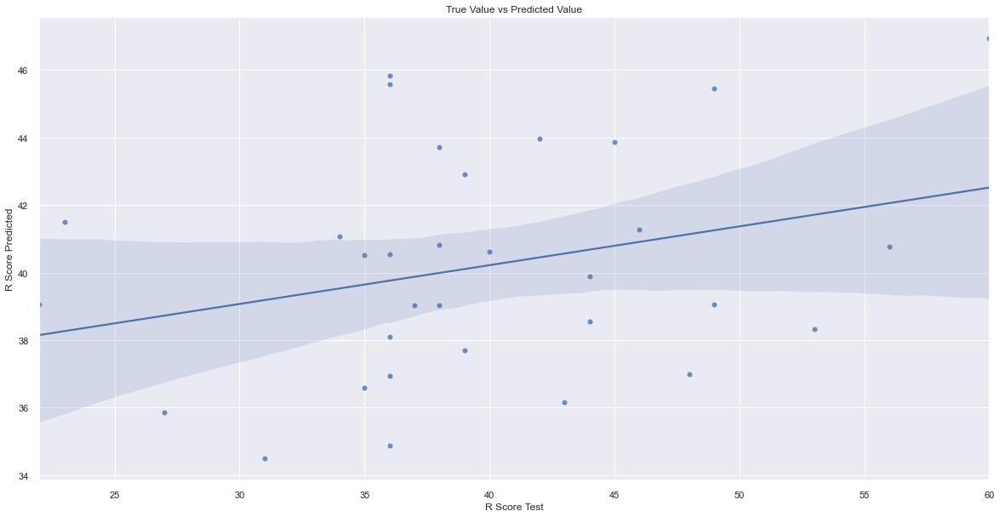

In [265]:
# Plotting the true and predicted value 
fig = plt.figure(figsize =(20, 10))
sns.regplot(y_test, y_pred2)
plt.xlabel("R Score Test")
plt.ylabel("R Score Predicted")
plt.title("True Value vs Predicted Value")
plt.show()

### Accuracy Count

In [266]:
# Chcking the accuracy of the model 
print("The accuracy of the model is", ridge.score(X_test, y_test))
print("The r2 score of the model is", r2_score(y_test, y_pred2))

The accuracy of the model is 0.07443143016228759
The r2 score of the model is 0.07443143016228759


### Evaluation Metrics

In [267]:
# Evaluation Metrics
print("The Absolute Mean Error of the model is", mean_absolute_error(y_test, y_pred2))
print("The Mean Squared Error of the model is", mean_squared_error(y_test, y_pred2))

The Absolute Mean Error of the model is 6.229593620432183
The Mean Squared Error of the model is 64.28272570145339


In [268]:
# Intercept of the model
intercept2 = linear_regressor.intercept_

# Coefficeints of the model
m2 = linear_regressor.coef_

In [269]:
print("The intercept of the model is", intercept2, "\n\nThe weights of the features are as follows:\n", m2)

The intercept of the model is 28.400182943463765 

The weights of the features are as follows:
 [-0.10489657  3.53723124  0.32173434  1.06896756  0.44725091 -0.44803586
 -1.22183026  0.49078693 -0.35375596  0.46968798  0.03460026  0.6751936
  0.40817922  0.47759282  0.19753096 -0.66956784  1.85206196 -1.18249412]


# **Decision Tree Model**

In [270]:
# Fitting the Data
tree = DecisionTreeRegressor(max_depth=4)
tree.fit(X_train, y_train)

# Predicting the Target Variable
y_pred3 = tree.predict(X_test)

### Regression Plot

C:\Users\Lenovo\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



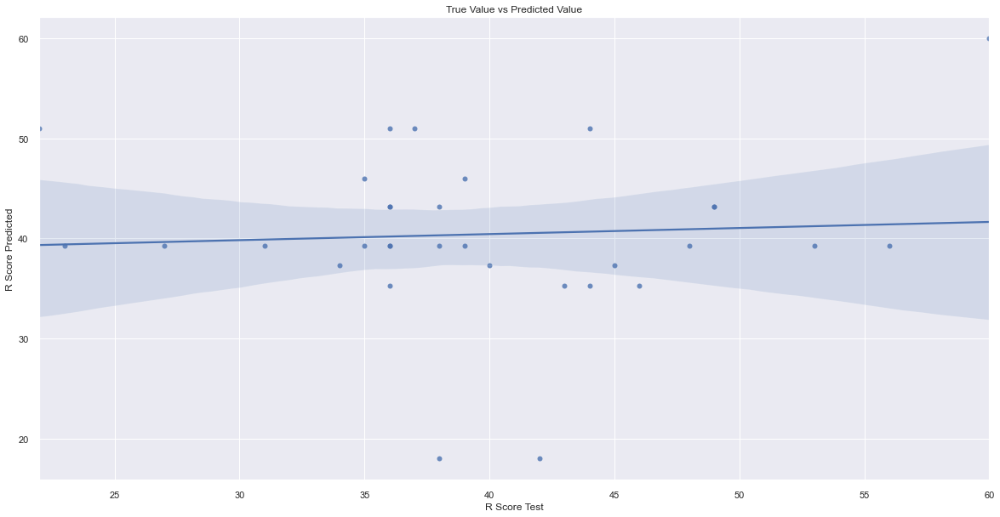

In [271]:
# Plotting the true and predicted value 
fig = plt.figure(figsize =(20, 10))
sns.regplot(y_test, y_pred3)
plt.xlabel("R Score Test")
plt.ylabel("R Score Predicted")
plt.title("True Value vs Predicted Value")
plt.show()

[Text(0.5625, 0.9, 'x[14] <= 5.167\nsquared_error = 44.384\nsamples = 73\nvalue = 40.164'),
 Text(0.3125, 0.7, 'x[7] <= 6.5\nsquared_error = 36.127\nsamples = 46\nvalue = 38.217'),
 Text(0.25, 0.5, 'x[14] <= 4.792\nsquared_error = 33.218\nsamples = 45\nvalue = 37.933'),
 Text(0.125, 0.3, 'x[5] <= 6.5\nsquared_error = 24.999\nsamples = 37\nvalue = 38.973'),
 Text(0.0625, 0.1, 'squared_error = 22.256\nsamples = 36\nvalue = 39.278'),
 Text(0.1875, 0.1, 'squared_error = 0.0\nsamples = 1\nvalue = 28.0'),
 Text(0.375, 0.3, 'x[6] <= 4.5\nsquared_error = 43.109\nsamples = 8\nvalue = 33.125'),
 Text(0.3125, 0.1, 'squared_error = 0.0\nsamples = 1\nvalue = 18.0'),
 Text(0.4375, 0.1, 'squared_error = 11.918\nsamples = 7\nvalue = 35.286'),
 Text(0.375, 0.5, 'squared_error = 0.0\nsamples = 1\nvalue = 51.0'),
 Text(0.8125, 0.7, 'x[14] <= 6.75\nsquared_error = 40.99\nsamples = 27\nvalue = 43.481'),
 Text(0.75, 0.5, 'x[13] <= 5.5\nsquared_error = 31.669\nsamples = 26\nvalue = 42.846'),
 Text(0.625, 0.3

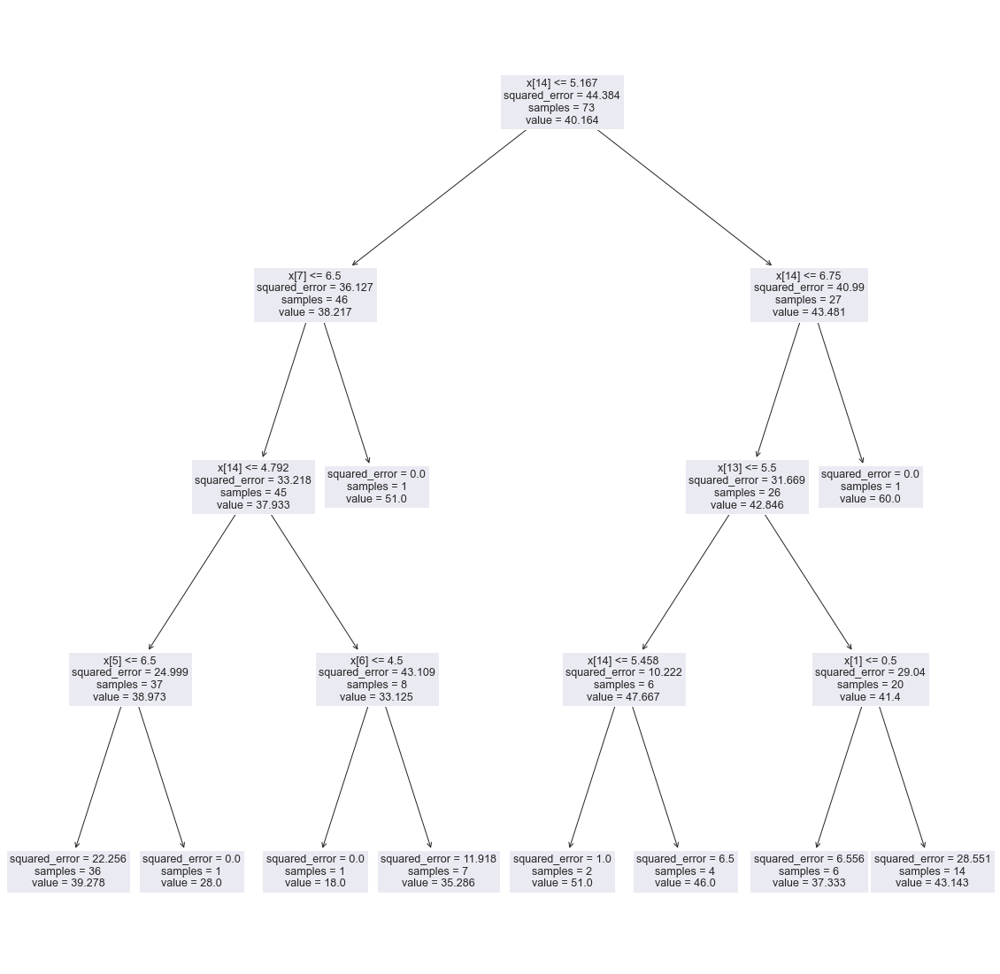

In [272]:
from sklearn.tree import plot_tree
import matplotlib.pyplot as plt

# Show the decision tree
plt.figure(figsize=(20,20))
plot_tree(tree)

### Accuracy Count

In [273]:
# Chcking the accuracy of the model 
print("The accuracy of the model is", tree.score(X_test, y_test))
print("The r2 score of the model is", r2_score(y_test, y_pred3))

The accuracy of the model is -0.8230154179572293
The r2 score of the model is -0.8230154179572293


### Evaluation Metrics

In [274]:
# Evaluation Metrics
print("The Absolute Mean Error of the model is", mean_absolute_error(y_test, y_pred3))
print("The Mean Squared Error of the model is", mean_squared_error(y_test, y_pred3))  

The Absolute Mean Error of the model is 9.00173611111111
The Mean Squared Error of the model is 126.6123374118166


In [275]:
# Intercept of the model
intercept3 = linear_regressor.intercept_

# Coefficeints of the model
m3 = linear_regressor.coef_

In [276]:
print("The intercept of the model is", intercept3, "\n\nThe weights of the features are as follows:\n", m3)

The intercept of the model is 28.400182943463765 

The weights of the features are as follows:
 [-0.10489657  3.53723124  0.32173434  1.06896756  0.44725091 -0.44803586
 -1.22183026  0.49078693 -0.35375596  0.46968798  0.03460026  0.6751936
  0.40817922  0.47759282  0.19753096 -0.66956784  1.85206196 -1.18249412]


# **Random Forest Model**

In [277]:
# Fitting the Data
forest = RandomForestRegressor(n_estimators=100)
forest.fit(X_train, y_train)

# Predicting the Target Variable
y_pred4 = forest.predict(X_test)

### Regression Plot

C:\Users\Lenovo\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



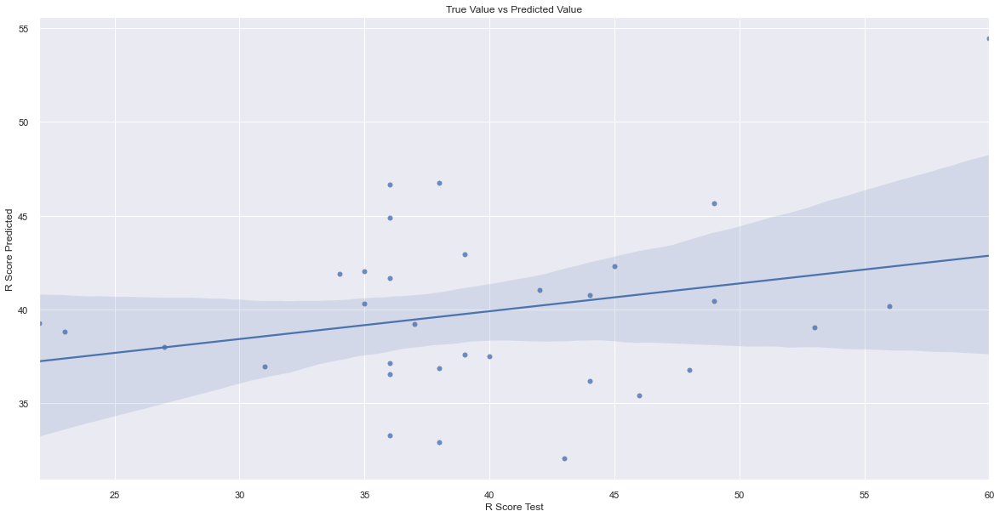

In [278]:
# Plotting the true and predicted value 
fig = plt.figure(figsize =(20, 10))
sns.regplot(y_test, y_pred4)
plt.xlabel("R Score Test")
plt.ylabel("R Score Predicted")
plt.title("True Value vs Predicted Value")
plt.show()

### Accuracy Count

In [279]:
# Chcking the accuracy of the model 
print("The accuracy of the model is", forest.score(X_test, y_test))
print("The r2 score of the model is", r2_score(y_test, y_pred4))

The accuracy of the model is 0.006833568151033309
The r2 score of the model is 0.006833568151033309


### Evaluation Metrics

In [280]:
# Evaluation Metrics
print("The Absolute Mean Error of the model is", mean_absolute_error(y_test, y_pred4))
print("The Mean Squared Error of the model is", mean_squared_error(y_test, y_pred4))

The Absolute Mean Error of the model is 6.861197916666667
The Mean Squared Error of the model is 68.97754244791666


In [281]:
# Intercept of the model
intercept4 = linear_regressor.intercept_

# Coefficeints of the model
m4 = linear_regressor.coef_

In [282]:
print("The intercept of the model is", intercept4, "\n\nThe weights of the features are as follows:\n", m4)

The intercept of the model is 28.400182943463765 

The weights of the features are as follows:
 [-0.10489657  3.53723124  0.32173434  1.06896756  0.44725091 -0.44803586
 -1.22183026  0.49078693 -0.35375596  0.46968798  0.03460026  0.6751936
  0.40817922  0.47759282  0.19753096 -0.66956784  1.85206196 -1.18249412]


# **Stochastic Gradient Descent Model**

In [283]:
# Fitting the Data
sgdr = SGDRegressor()
sgdr.fit(X_train, y_train)

# Predicting the Target Variable
y_pred5 = sgdr.predict(X_test)

### Regression Plot

C:\Users\Lenovo\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



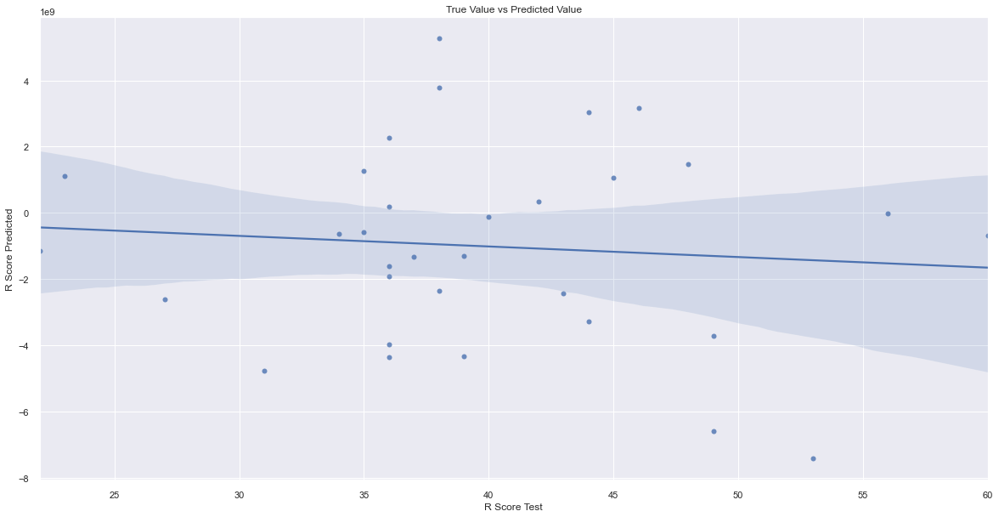

In [284]:
# Plotting the true and predicted value 
fig = plt.figure(figsize =(20, 10))
sns.regplot(y_test, y_pred5)
plt.xlabel("R Score Test")
plt.ylabel("R Score Predicted")
plt.title("True Value vs Predicted Value")
plt.show()

### Accuracy Count

In [285]:
# Chcking the accuracy of the model 
print("The accuracy of the model is", sgdr.score(X_train, y_train))
cv_score = cross_val_score(sgdr, X, y, cv = 10)
print("CV mean score: ", cv_score.mean())

The accuracy of the model is -1.3906585318577458e+17
CV mean score:  -5.888868544976294e+16


# **Boosting Efficiency**

In [286]:
#generic function to fit model and return metrics for every algorithm
def boost_models(x):
    #transforming target variable through quantile transformer
    regr_trans = TransformedTargetRegressor(regressor=x, transformer=QuantileTransformer(output_distribution='normal'))
    regr_trans.fit(X_train, y_train)
    yhat = regr_trans.predict(X_test)
    algoname= x.__class__.__name__
    return algoname, round(r2_score(y_test, yhat),3), round(mean_absolute_error(y_test, yhat),2), round(np.sqrt(mean_squared_error(y_test, yhat)),2)

algo=[GradientBoostingRegressor(), lightgbm.LGBMRegressor(), xgboost.XGBRFRegressor()]
score=[]

for a in algo:
    score.append(boost_models(a))

#Collate all scores in a table
pd.DataFrame(score, columns=['Model','Score','MAE','RMSE'])

C:\Users\Lenovo\anaconda3\lib\site-packages\sklearn\preprocessing\_data.py:2623: UserWarning:

n_quantiles (1000) is greater than the total number of samples (73). n_quantiles is set to n_samples.

C:\Users\Lenovo\anaconda3\lib\site-packages\sklearn\preprocessing\_data.py:2623: UserWarning:

n_quantiles (1000) is greater than the total number of samples (73). n_quantiles is set to n_samples.

C:\Users\Lenovo\anaconda3\lib\site-packages\sklearn\preprocessing\_data.py:2623: UserWarning:

n_quantiles (1000) is greater than the total number of samples (73). n_quantiles is set to n_samples.



,Model,Score,MAE,RMSE
0,GradientBoostingRegressor,-0.312,7.75,9.55
1,LGBMRegressor,0.030,6.80,8.21
2,XGBRFRegressor,-0.088,7.22,8.69


# **Overall Accuracy of all models**

In [287]:
df_accuracy = pd.DataFrame(columns = ['Regression', 'Score', 'R Score', 'MAE', 'MSE', 'RMSE'])
regression = ['Linear Regression', 'Transformed Target Regression', 'Ridge Regression', 'Decision Tree', 'Random Forest', 'Stochastic Gradient Descent']
regressor = [linear_regressor, regr_transformed, ridge, tree, forest, sgdr]
predicted = [y_pred0, y_pred1, y_pred2, y_pred3, y_pred4, y_pred5]

In [288]:
for i in range(len(regression)):
  accuracy_dict = {}
  accuracy_dict['Regression'] = regression[i]
  accuracy_dict['Score'] = regressor[i].score(X_test, y_test)
  accuracy_dict['R Score'] = r2_score(y_test, predicted[i])
  accuracy_dict['MAE'] = mean_absolute_error(y_test, predicted[i])
  accuracy_dict['MSE'] = mean_squared_error(y_test, predicted[i])
  accuracy_dict['RMSE'] = math.sqrt(mean_squared_error(y_test, predicted[i]))
  df_accuracy = df_accuracy.append(accuracy_dict, ignore_index = True)

In [289]:
df_accuracy

,Regression,Score,R Score,MAE,MSE,RMSE
0,Linear Regression,7.131779e-02,7.131779e-02,6.219503e+00,6.449897e+01,8.031125e+00
1,Transformed Target Regression,-9.298359e-01,-9.298359e-01,9.281250e+00,1.340312e+02,1.157719e+01
2,Ridge Regression,7.443143e-02,7.443143e-02,6.229594e+00,6.428273e+01,8.017651e+00
3,Decision Tree,-8.230154e-01,-8.230154e-01,9.001736e+00,1.266123e+02,1.125221e+01
4,Random Forest,6.833568e-03,6.833568e-03,6.861198e+00,6.897754e+01,8.305272e+00
5,Stochastic Gradient Descent,-1.361248e+17,-1.361248e+17,2.443267e+09,9.454162e+18,3.074762e+09


# **Deployment**

In [290]:
# SAVE RIDGE REGRESSION MODEL
pickle.dump(ridge, open("rg_model.pickle", 'wb'))
pickle.dump(gender_le, open("label_encoder_gender.pickle", 'wb'))
pickle.dump(one_hot_encoder_ss_status, open("one_hot_encoder_ss_status.pickle", 'wb'))

<hr>

In [292]:
df_original.to_csv('21112016_UncleanedDataset.csv')
df_clean.to_csv('21112016_CleanedDataset.csv')
df.to_csv('21112016_PreprocessedDataset.csv')